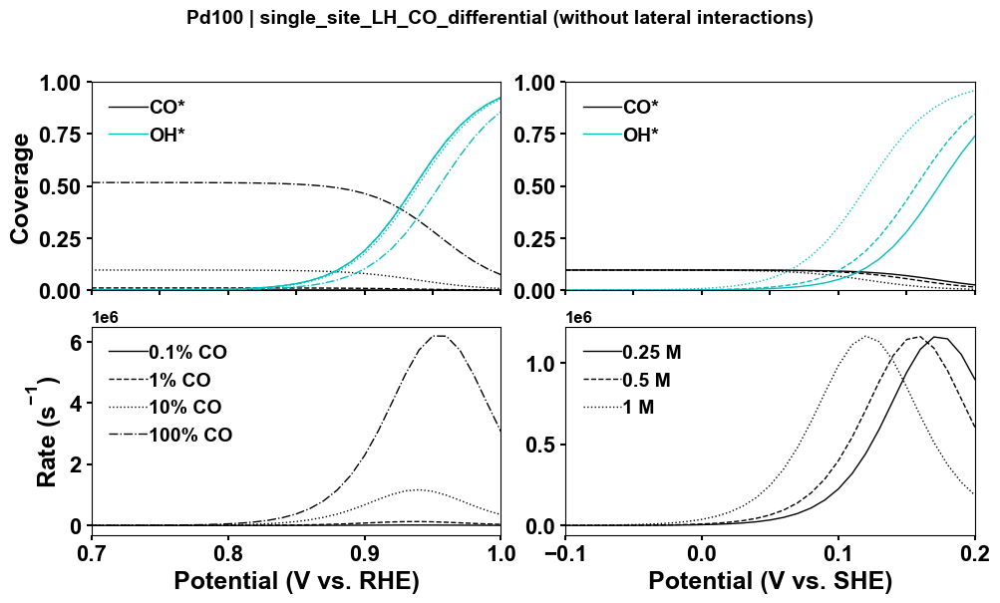

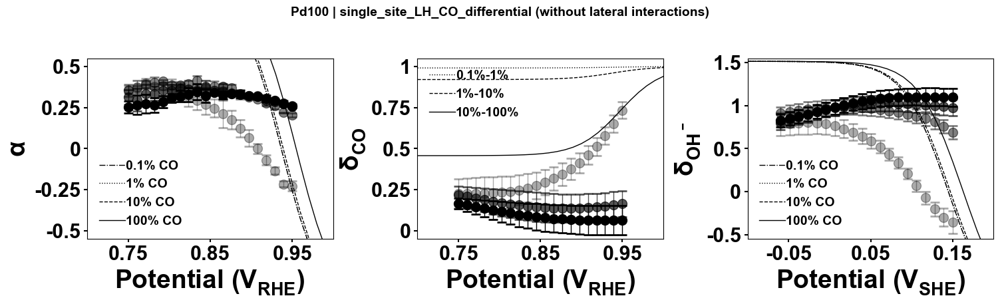

  saved: Pd100 | single_site_LH_CO_differential


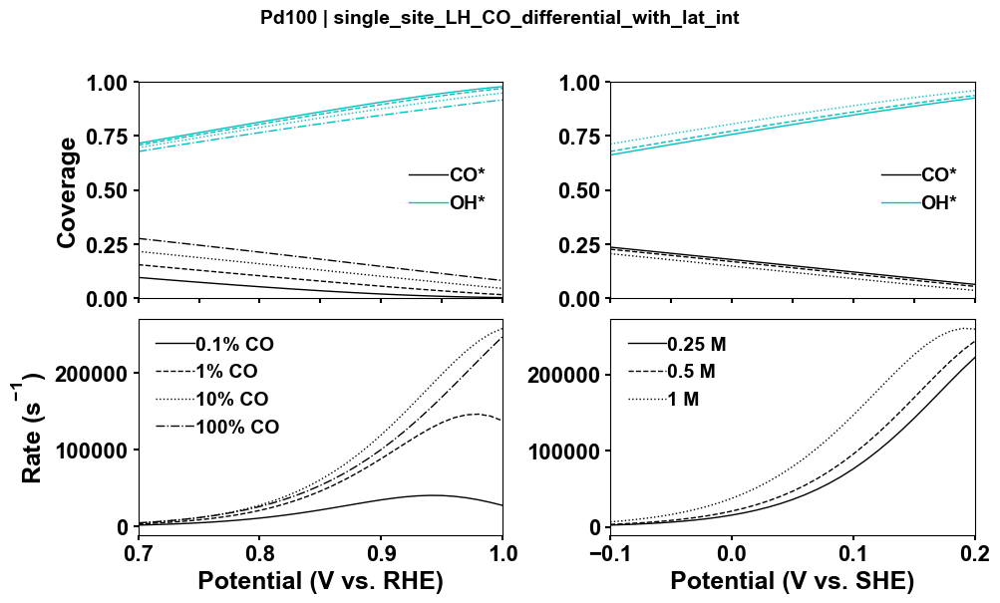

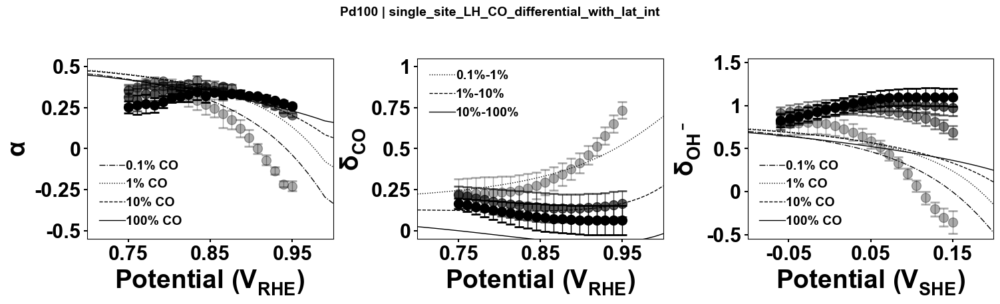

  saved: Pd100 | single_site_LH_CO_differential_with_lat_int


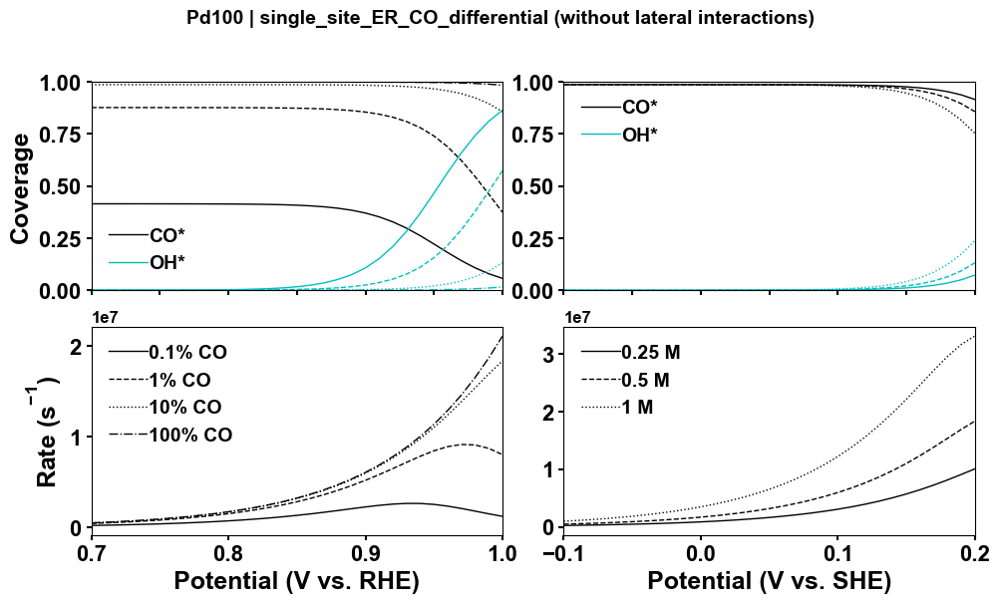

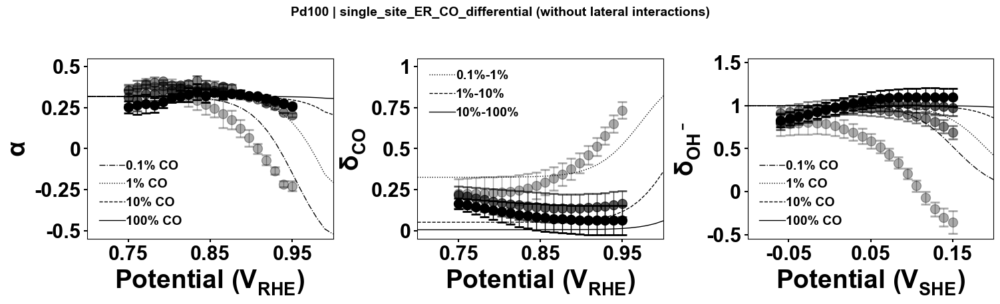

  saved: Pd100 | single_site_ER_CO_differential


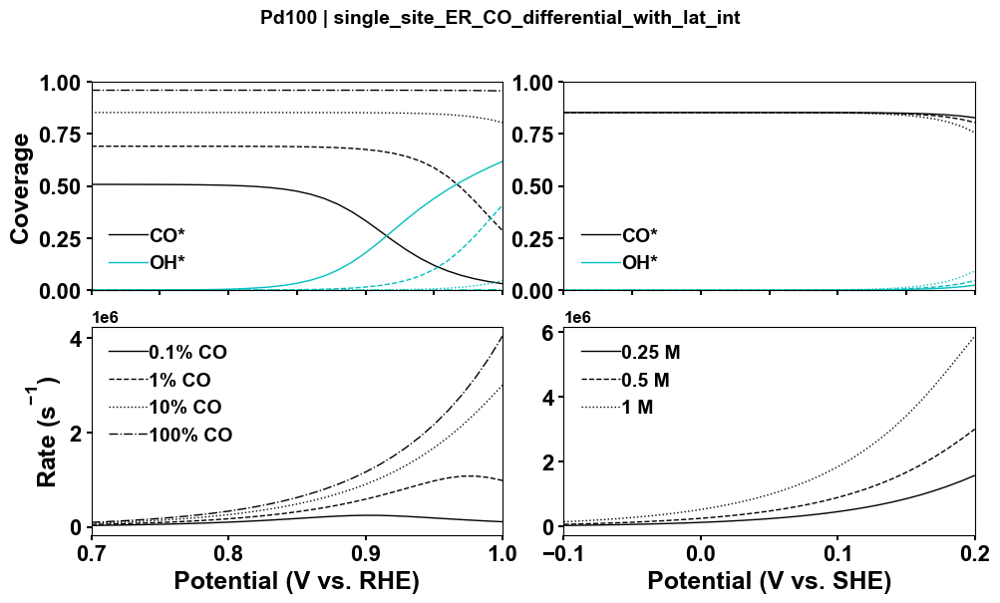

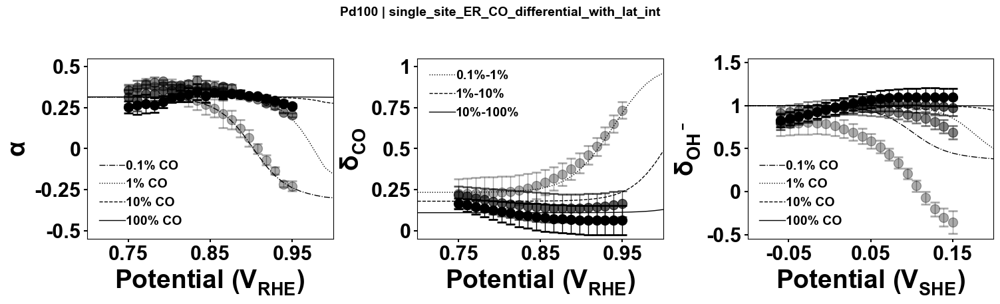

  saved: Pd100 | single_site_ER_CO_differential_with_lat_int


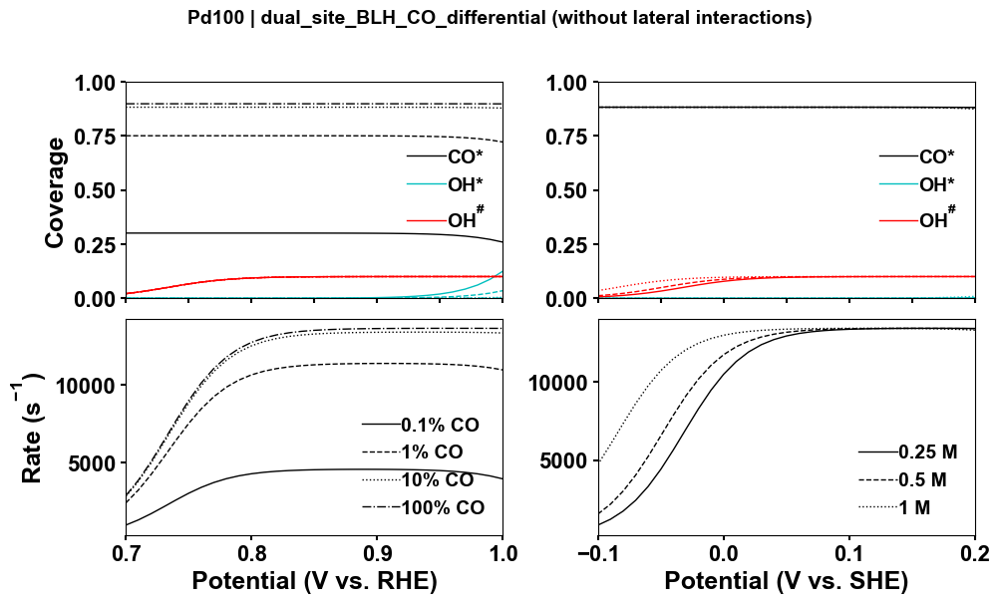

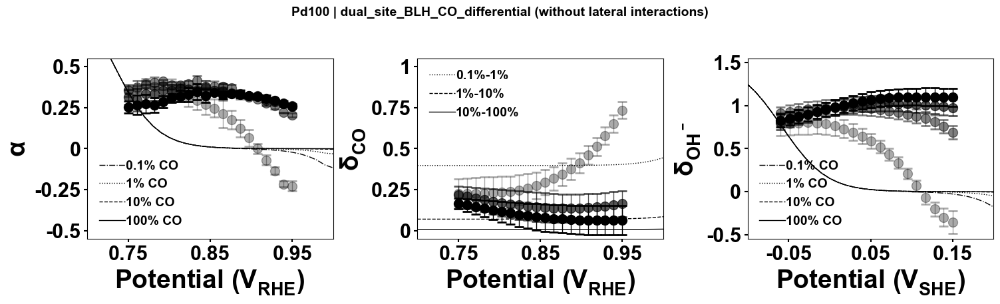

  saved: Pd100 | dual_site_BLH_CO_differential


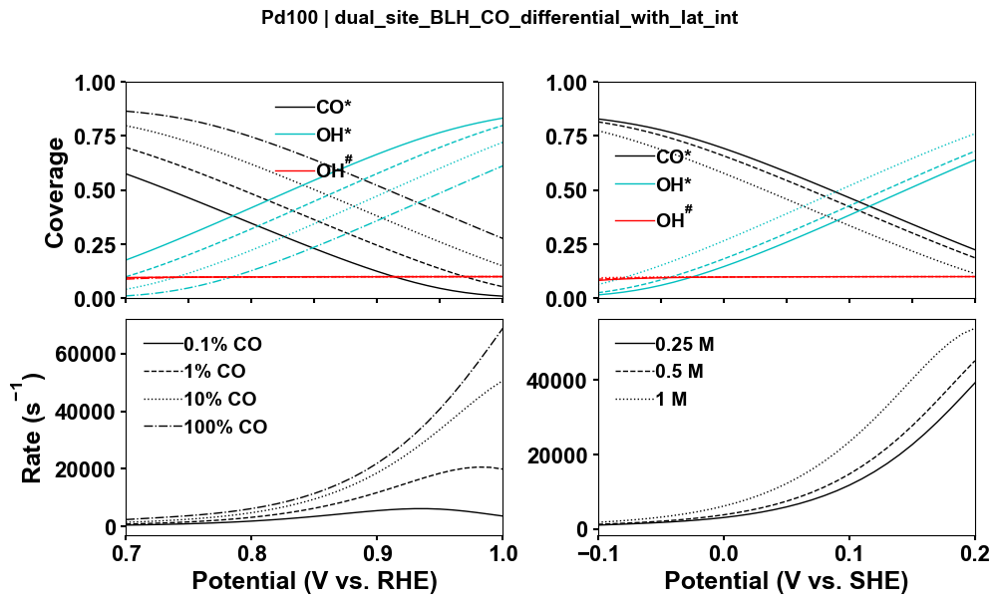

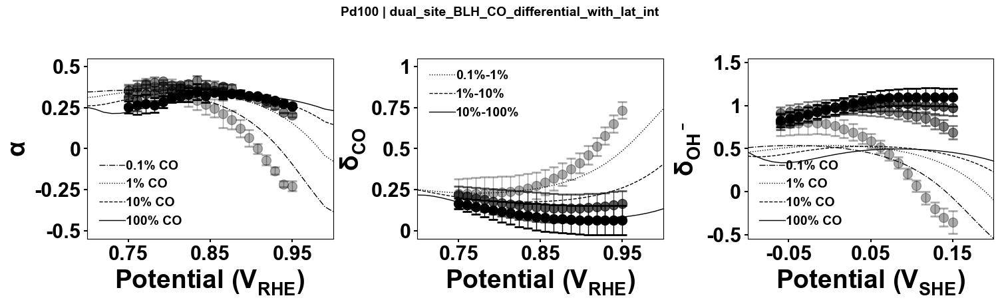

  saved: Pd100 | dual_site_BLH_CO_differential_with_lat_int


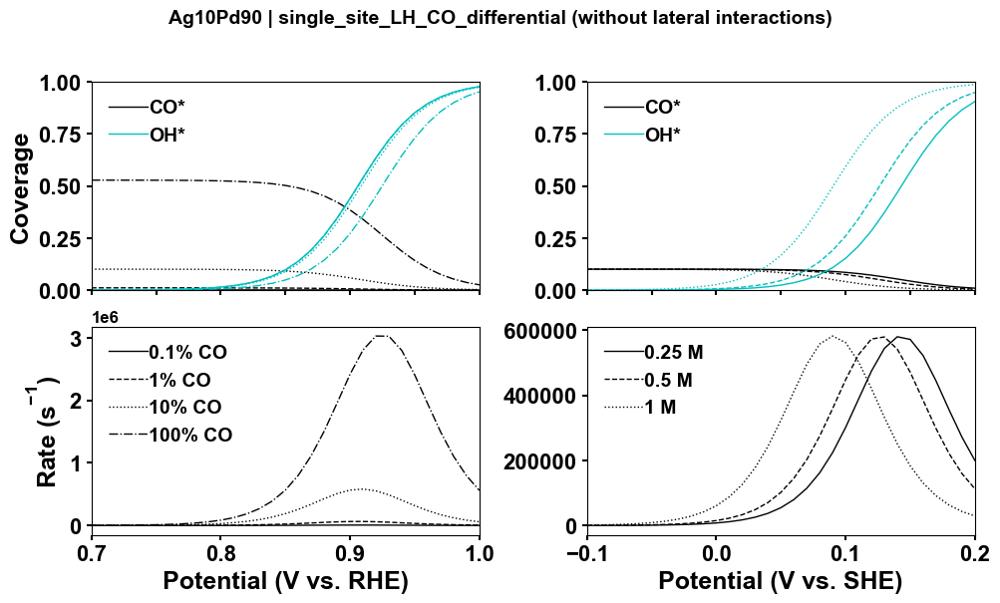

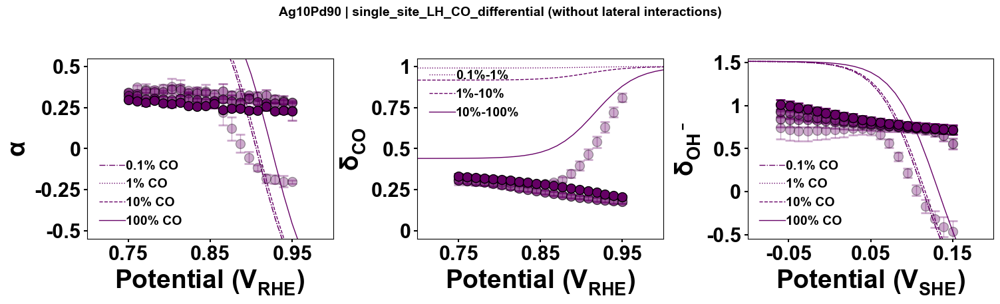

  saved: Ag10Pd90 | single_site_LH_CO_differential


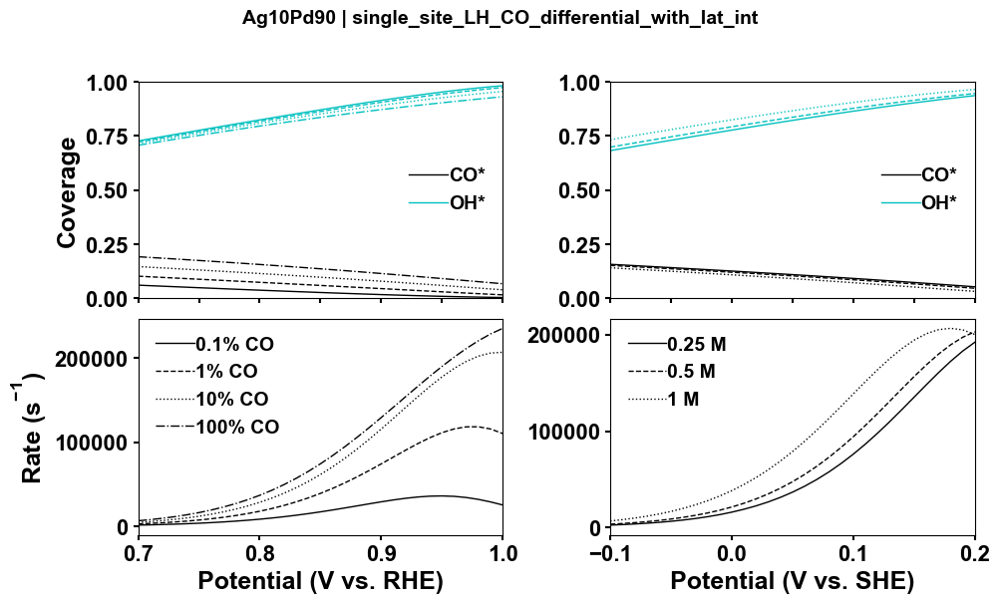

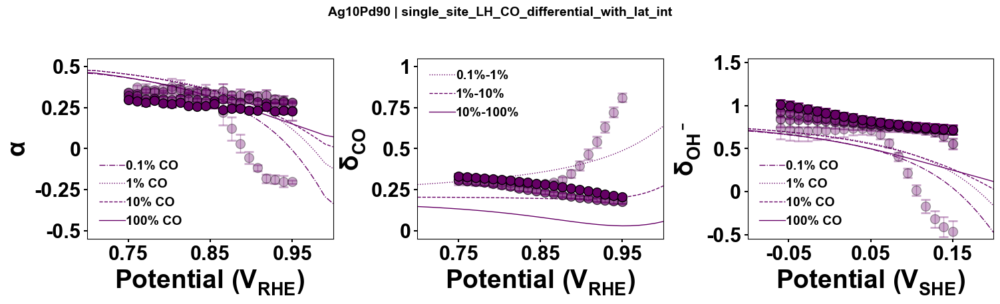

  saved: Ag10Pd90 | single_site_LH_CO_differential_with_lat_int


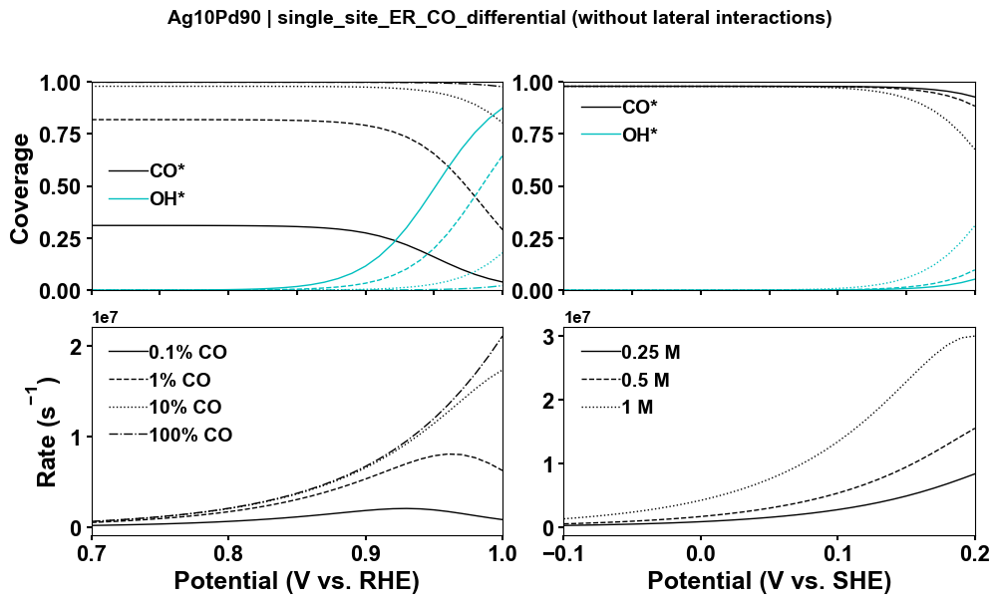

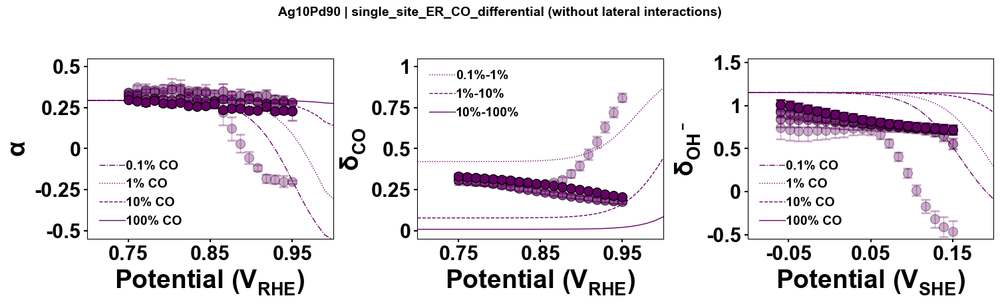

  saved: Ag10Pd90 | single_site_ER_CO_differential


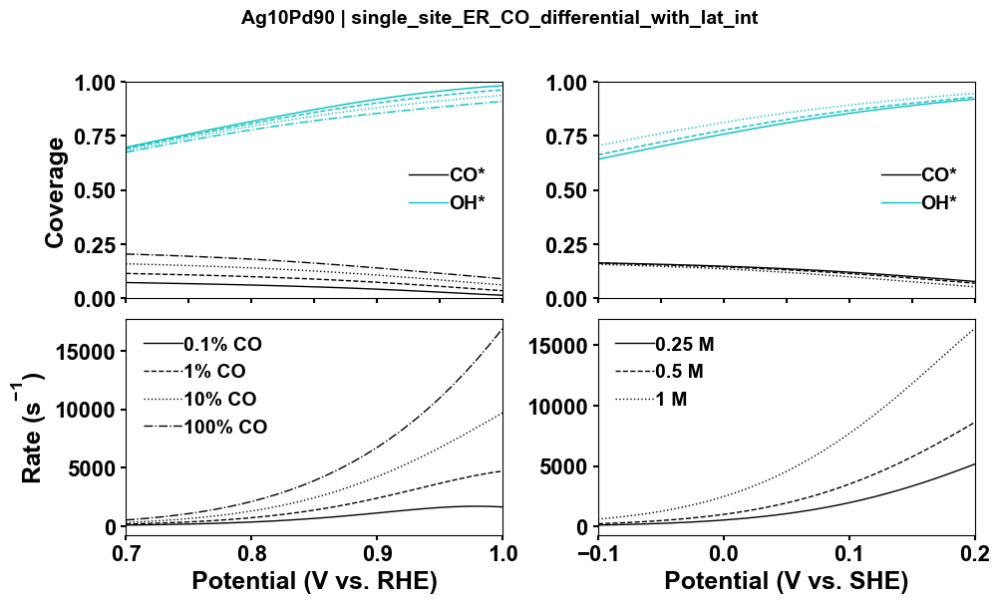

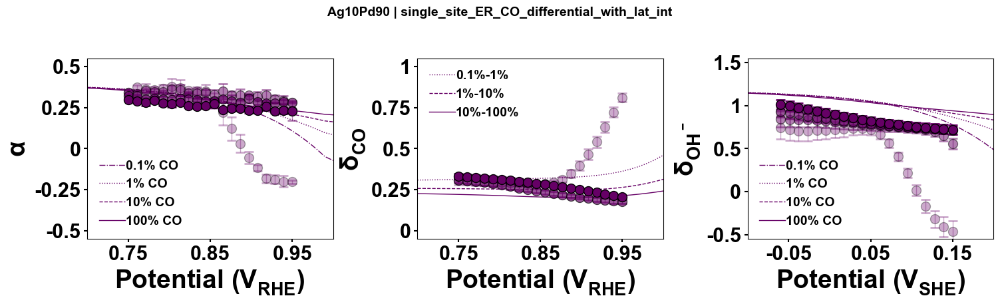

  saved: Ag10Pd90 | single_site_ER_CO_differential_with_lat_int


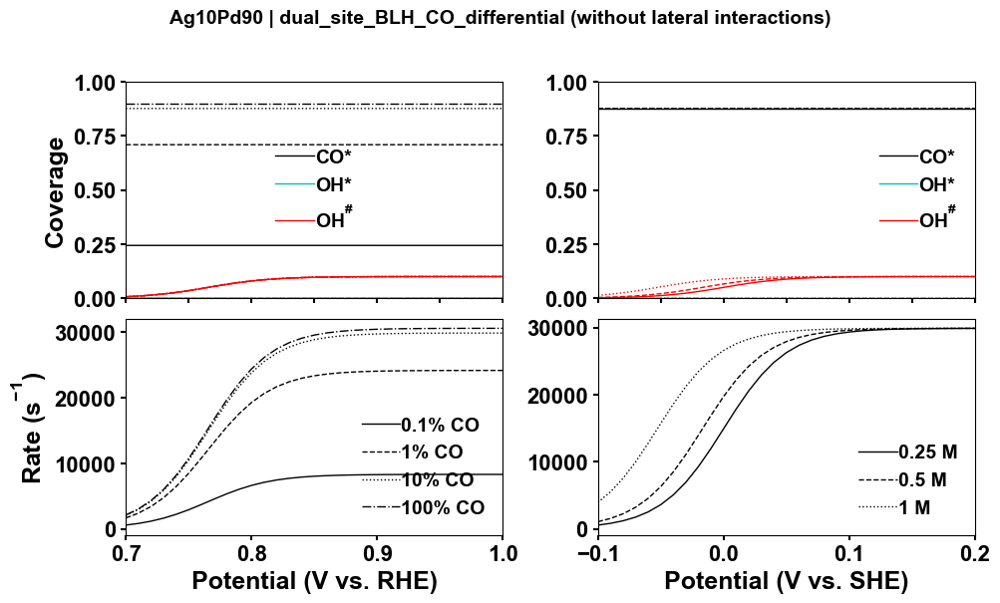

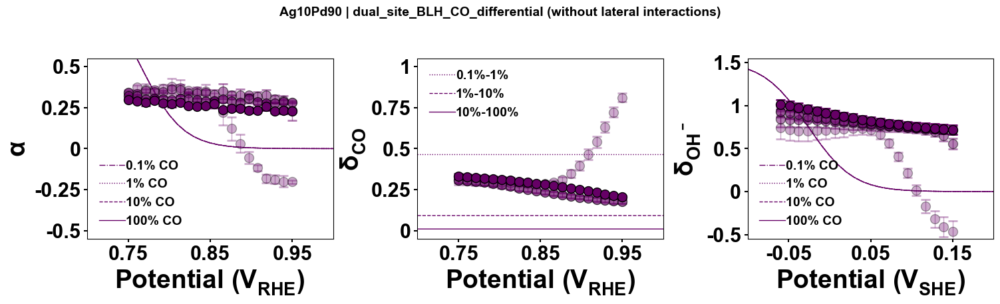

  saved: Ag10Pd90 | dual_site_BLH_CO_differential


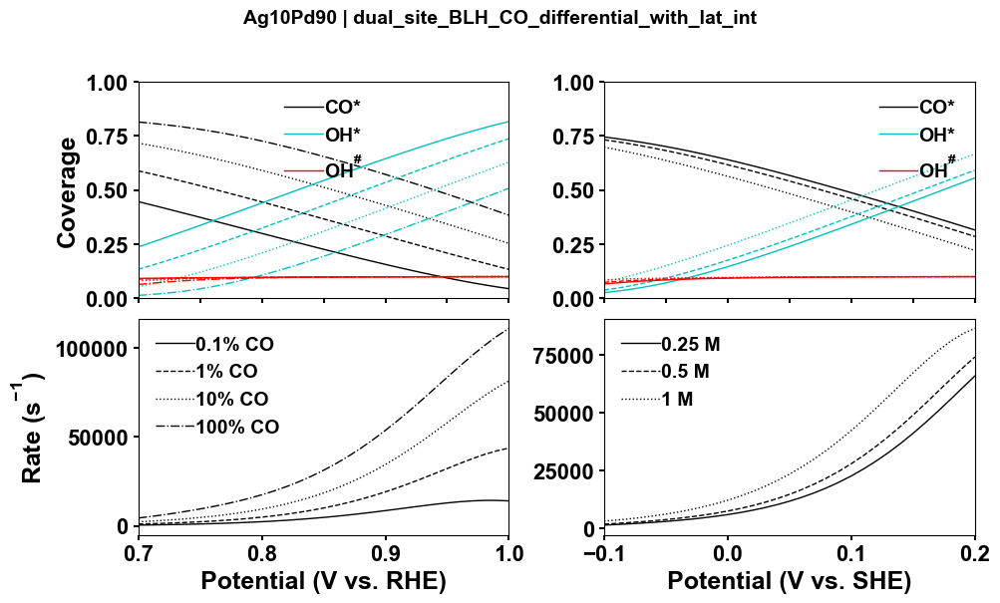

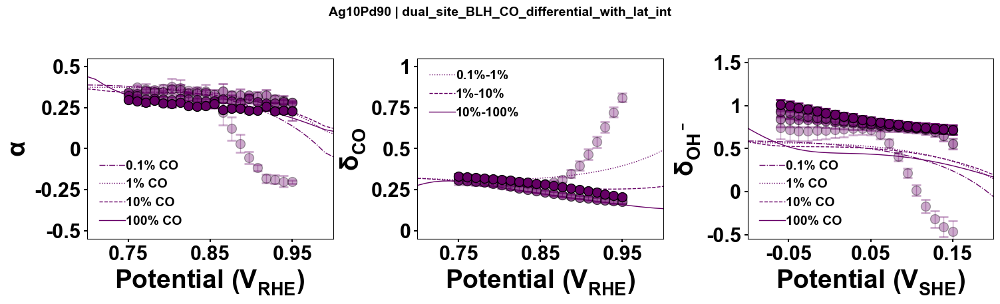

  saved: Ag10Pd90 | dual_site_BLH_CO_differential_with_lat_int


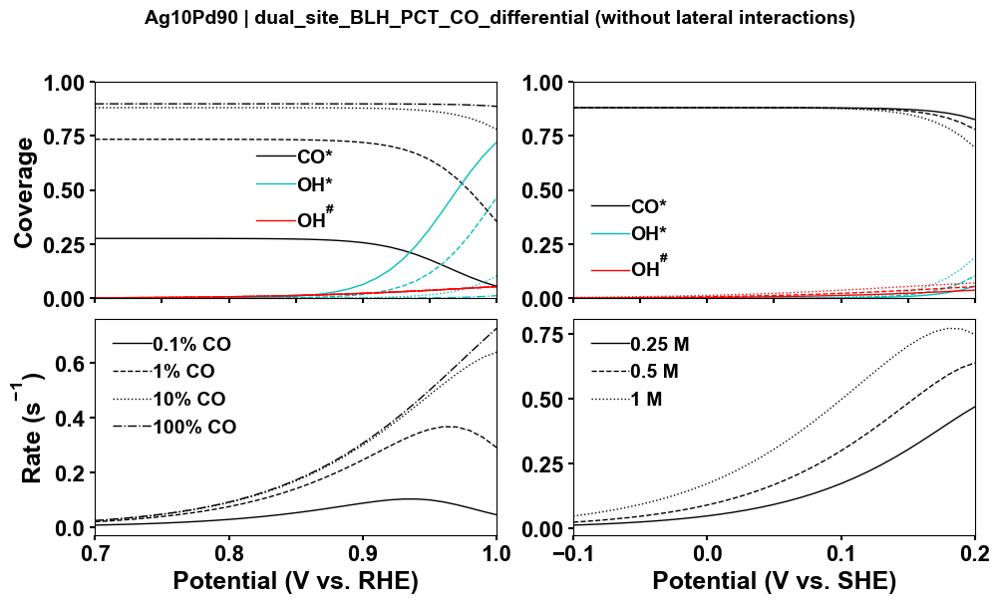

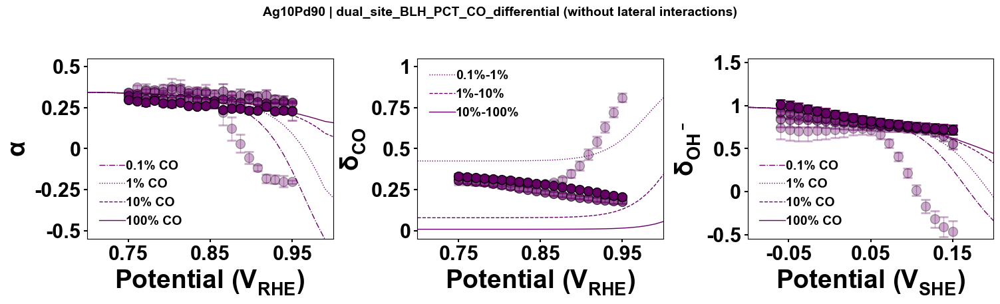

  saved: Ag10Pd90 | dual_site_BLH_PCT_CO_differential


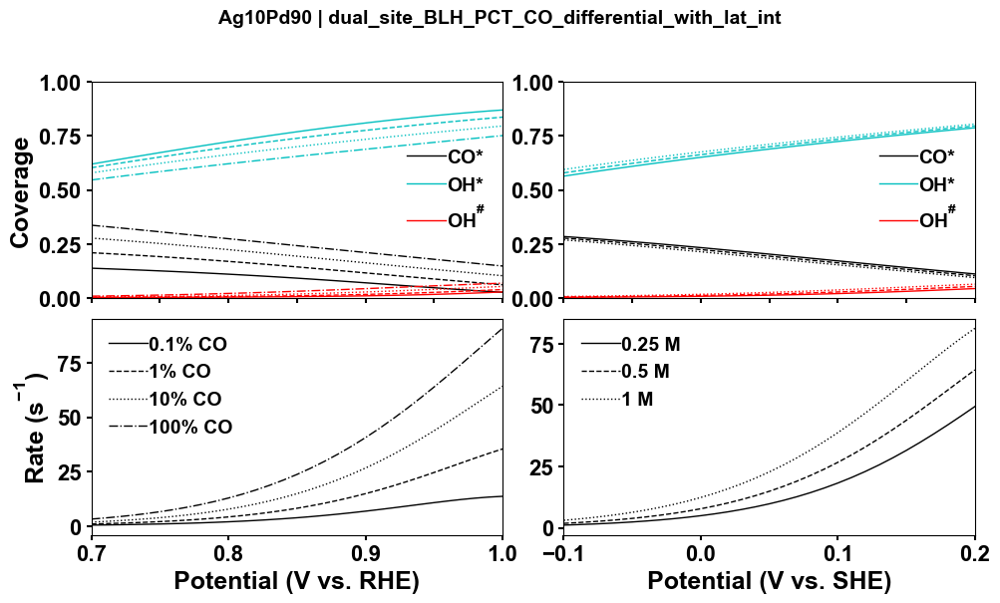

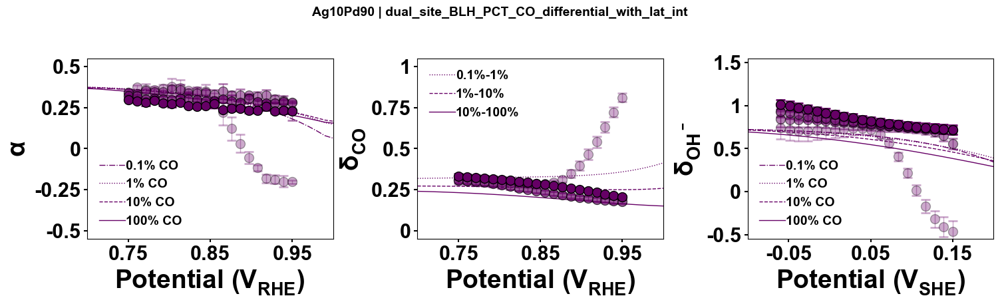

  saved: Ag10Pd90 | dual_site_BLH_PCT_CO_differential_with_lat_int


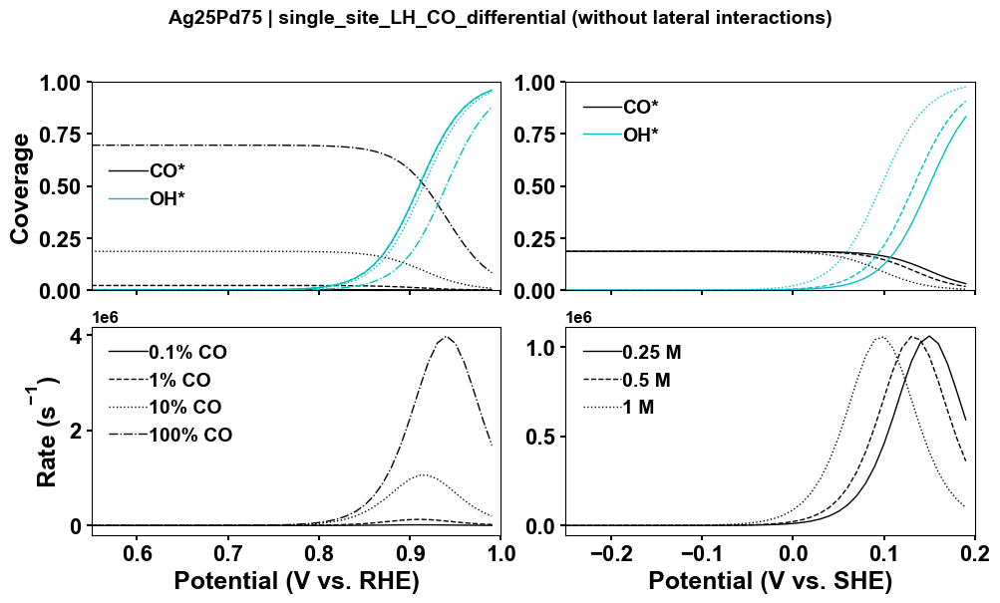

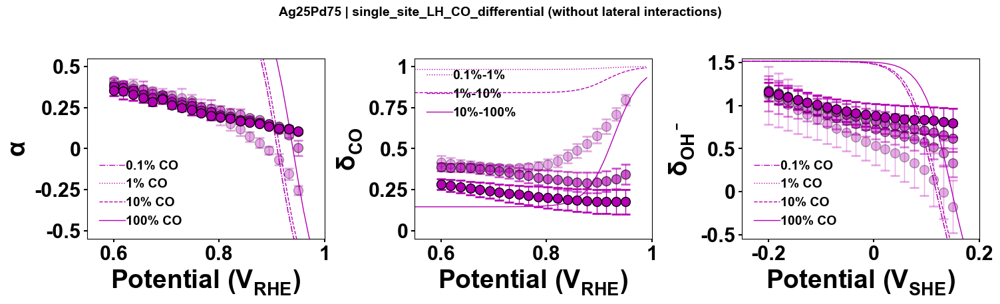

  saved: Ag25Pd75 | single_site_LH_CO_differential


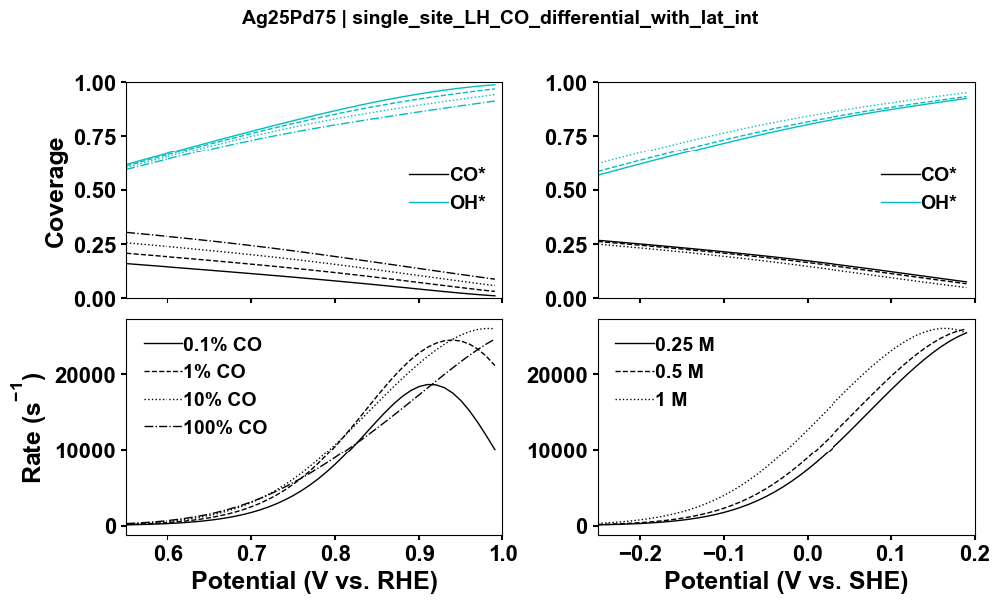

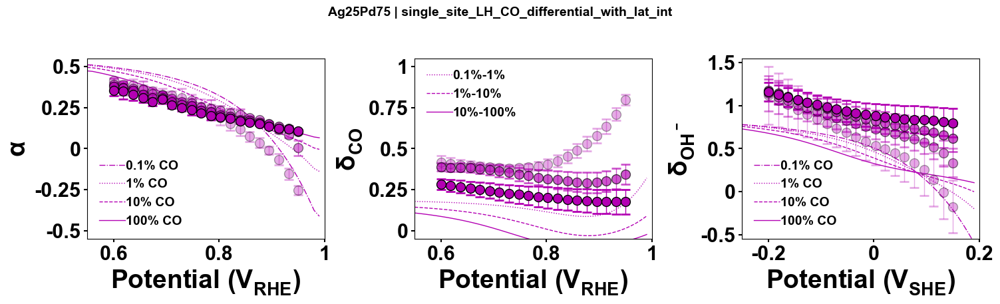

  saved: Ag25Pd75 | single_site_LH_CO_differential_with_lat_int


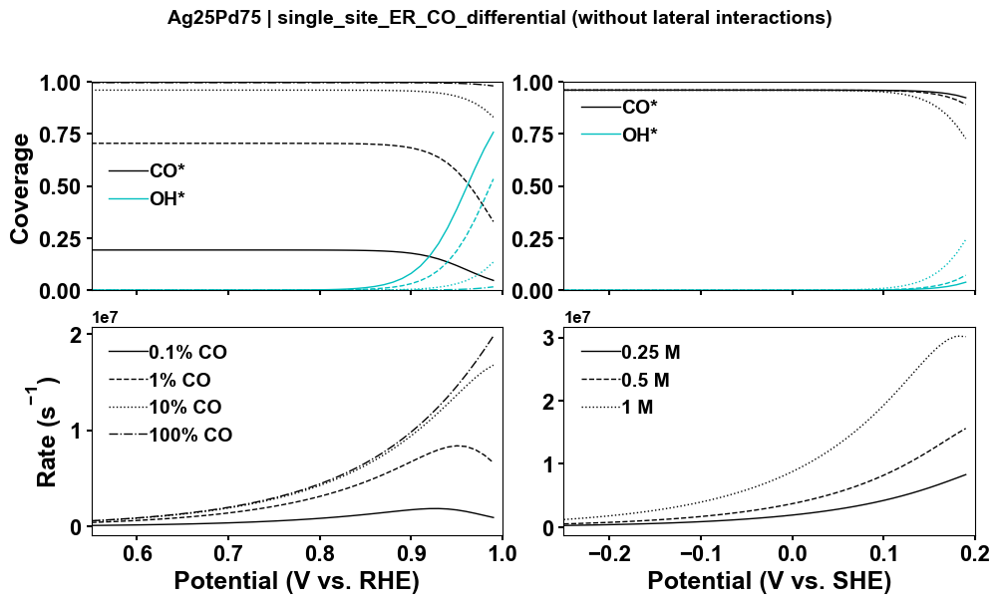

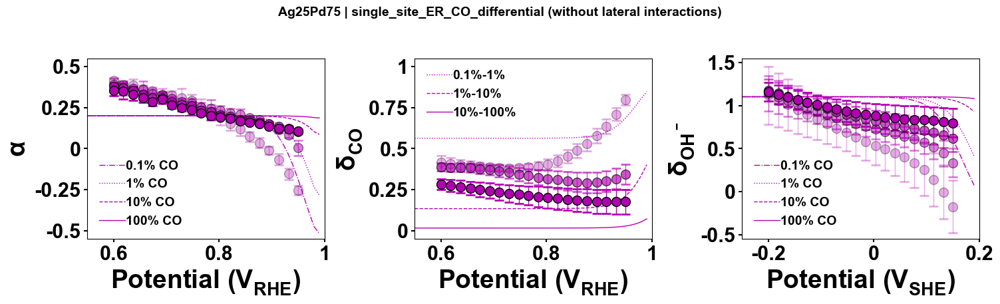

  saved: Ag25Pd75 | single_site_ER_CO_differential


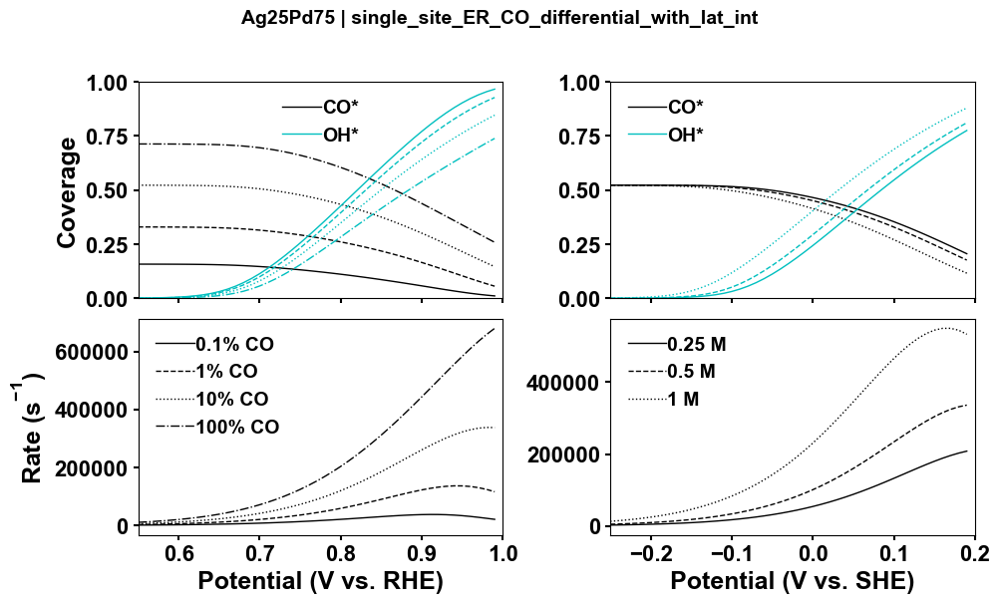

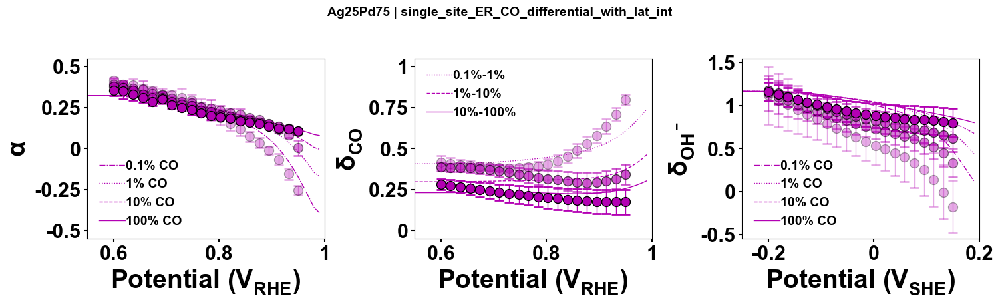

  saved: Ag25Pd75 | single_site_ER_CO_differential_with_lat_int


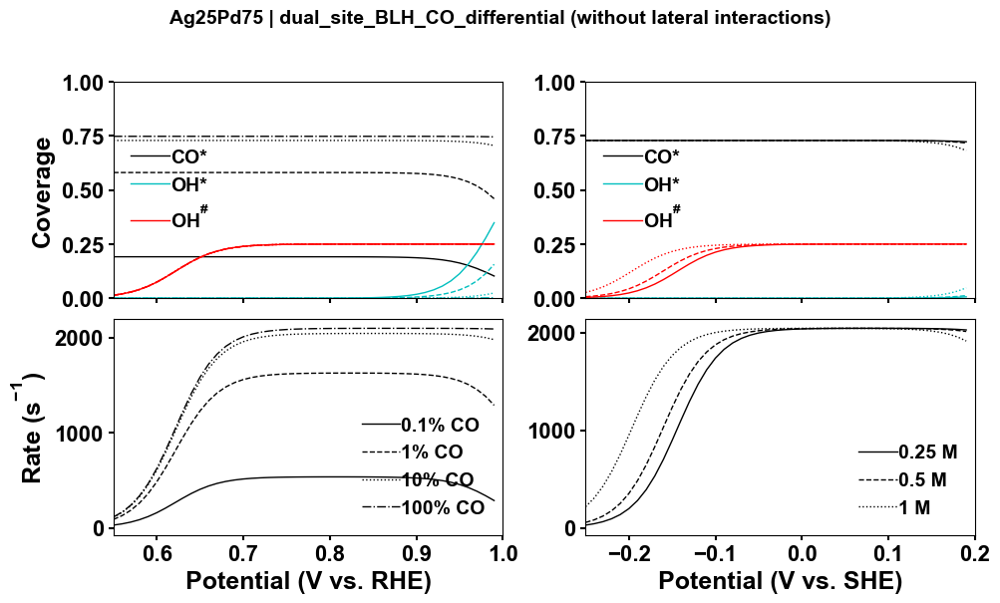

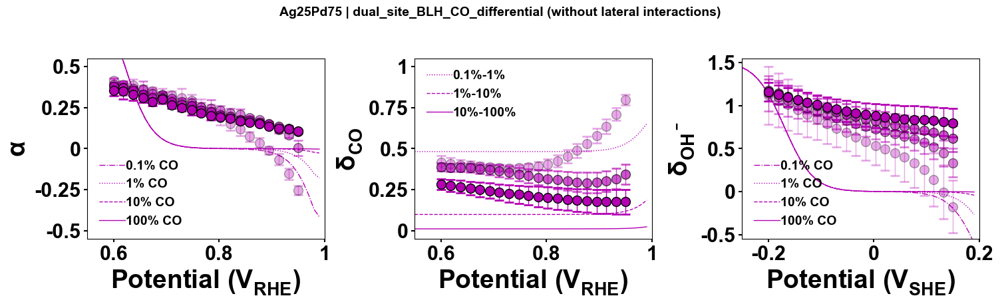

  saved: Ag25Pd75 | dual_site_BLH_CO_differential


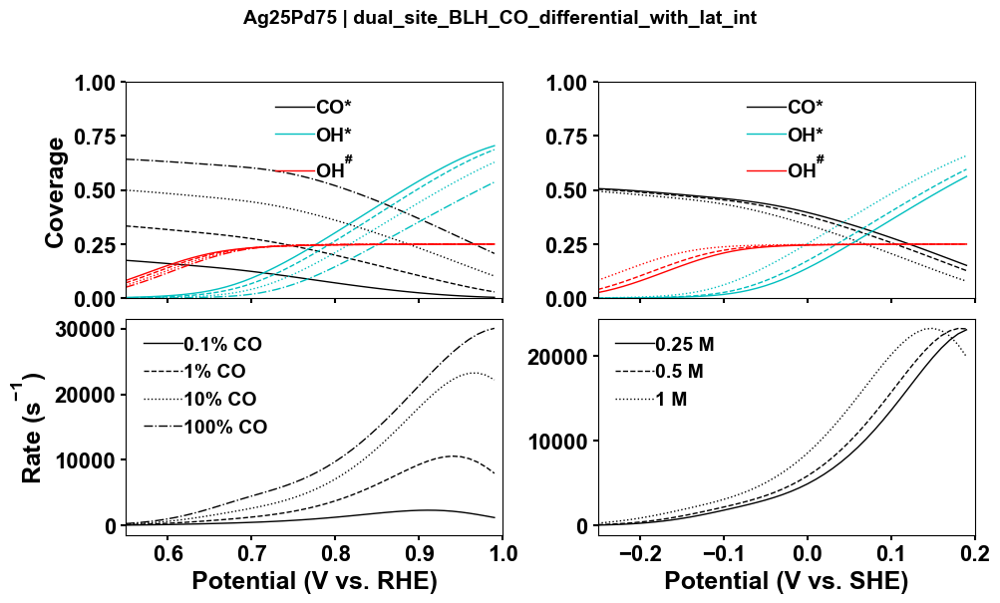

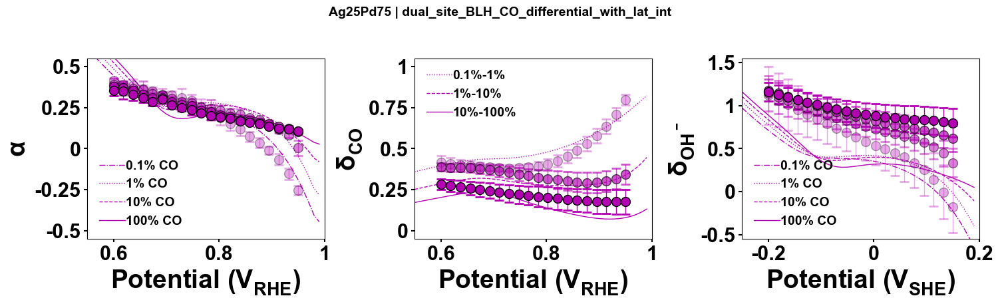

  saved: Ag25Pd75 | dual_site_BLH_CO_differential_with_lat_int


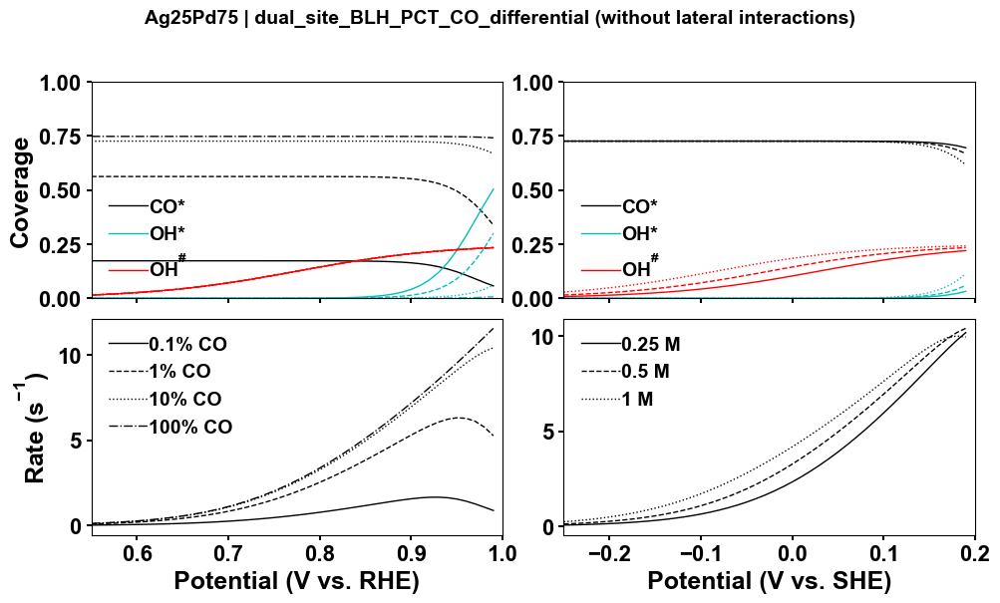

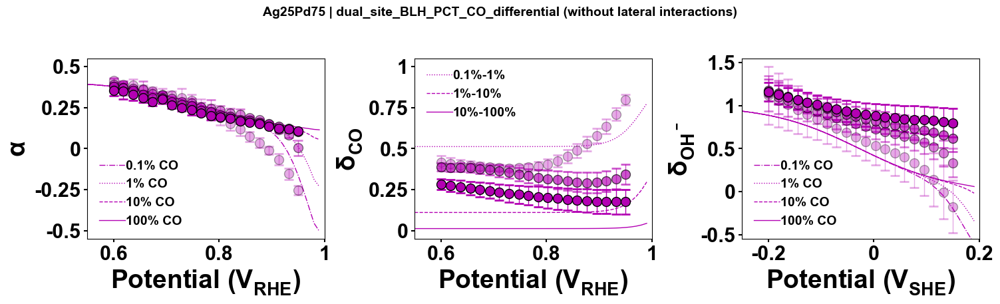

  saved: Ag25Pd75 | dual_site_BLH_PCT_CO_differential


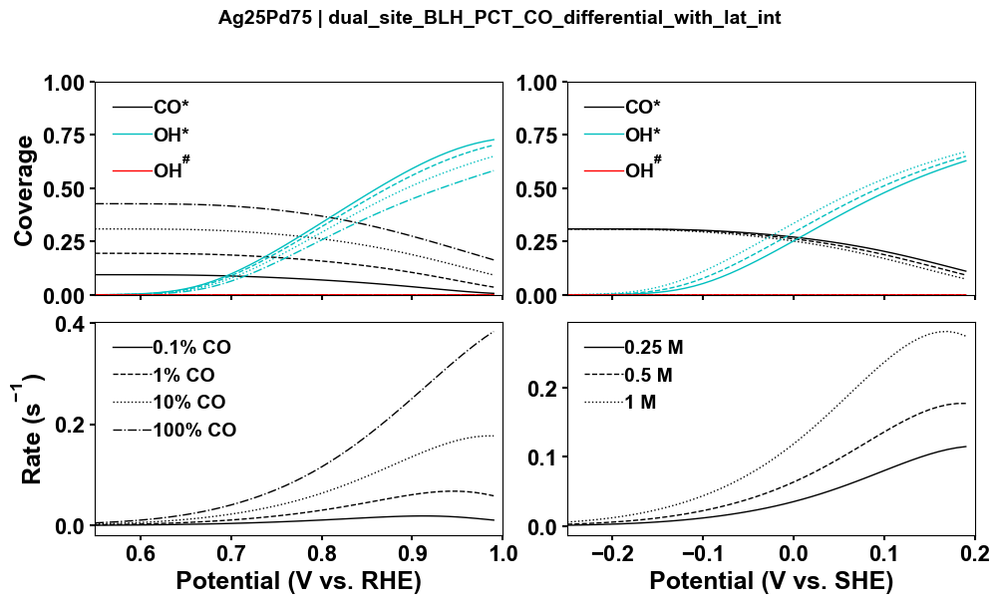

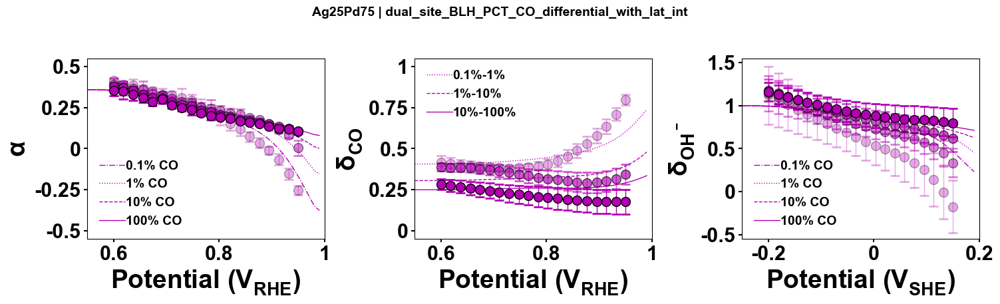

  saved: Ag25Pd75 | dual_site_BLH_PCT_CO_differential_with_lat_int


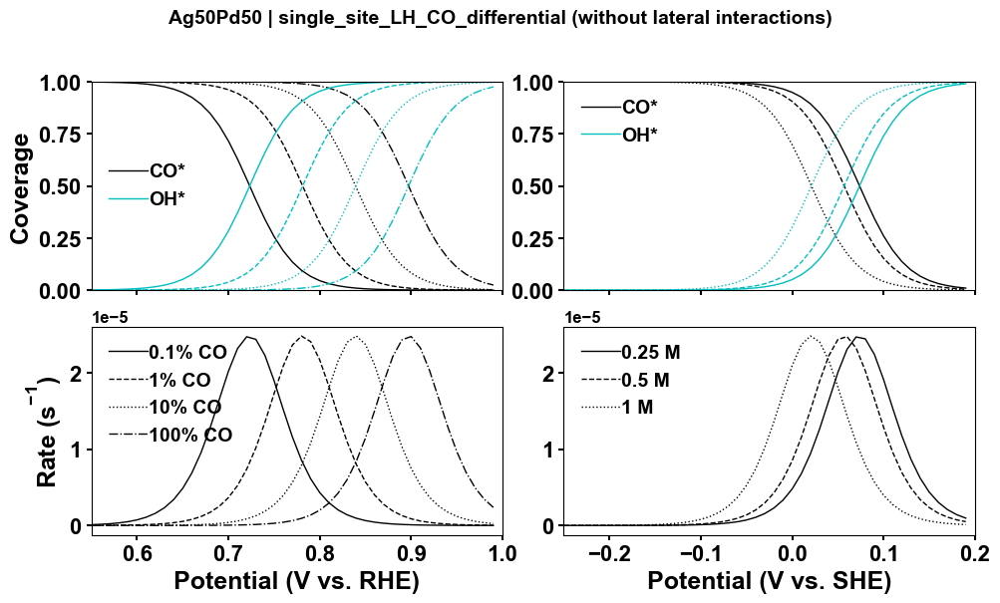

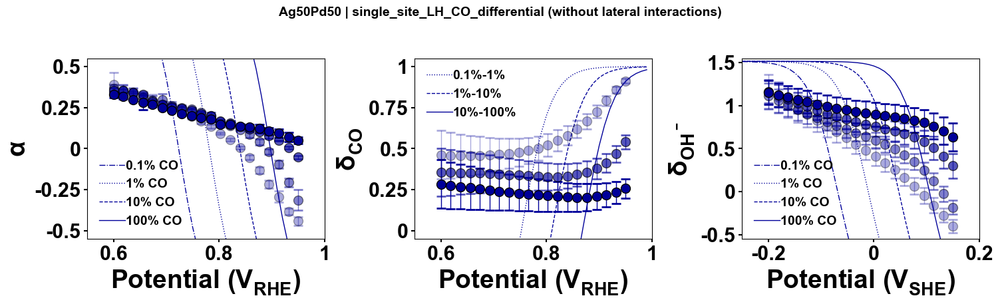

  saved: Ag50Pd50 | single_site_LH_CO_differential


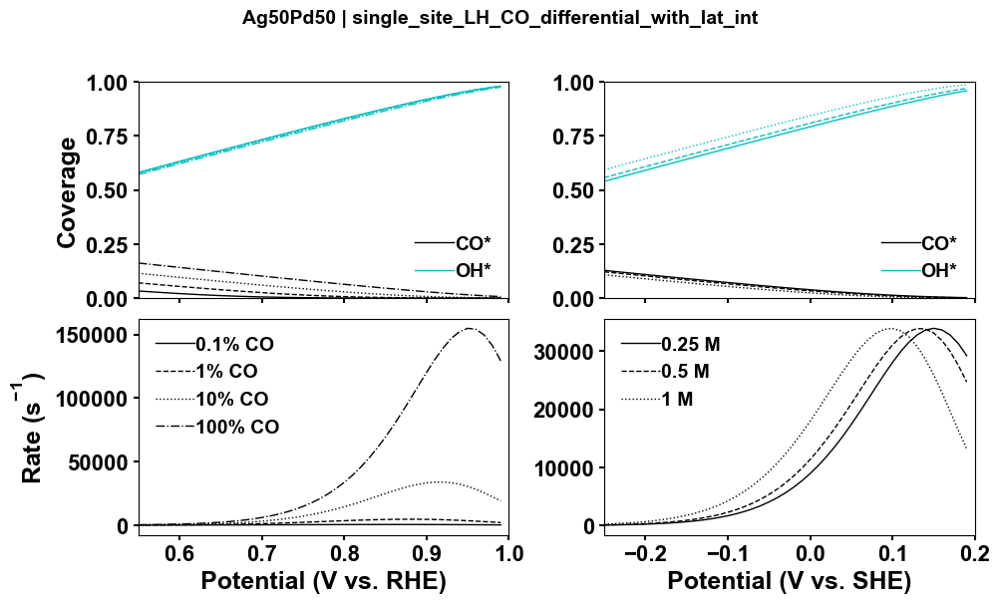

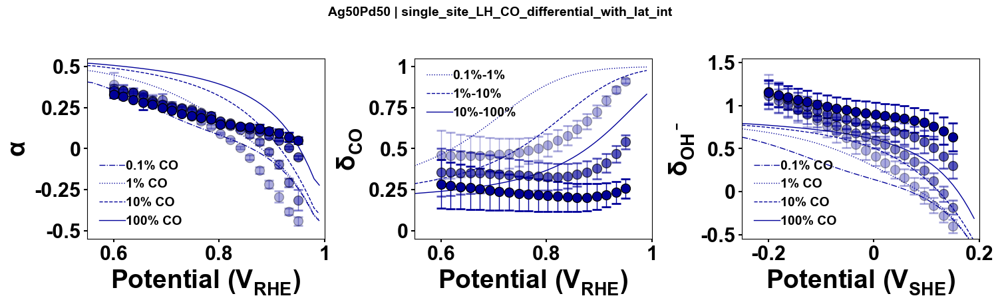

  saved: Ag50Pd50 | single_site_LH_CO_differential_with_lat_int


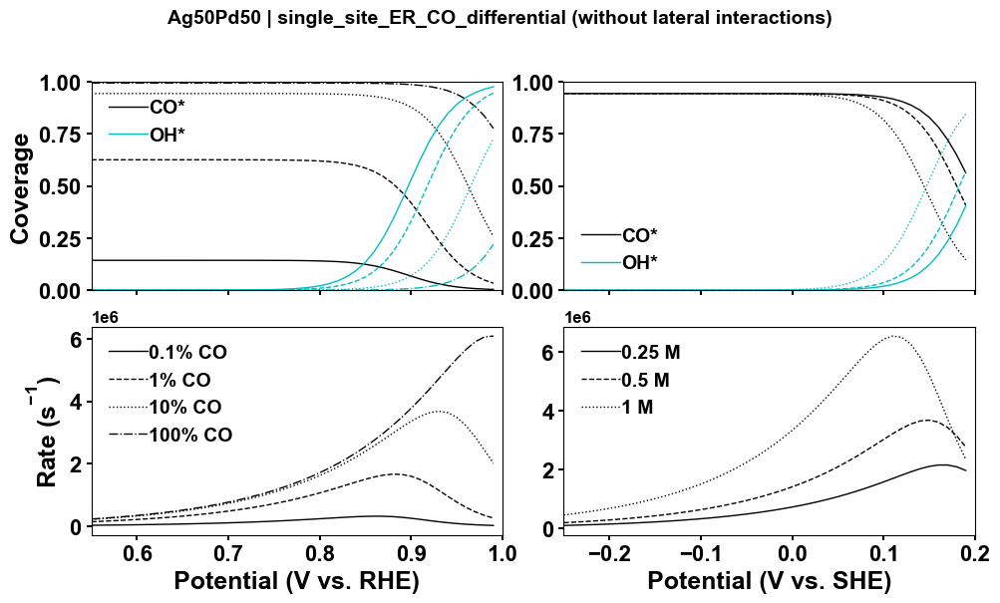

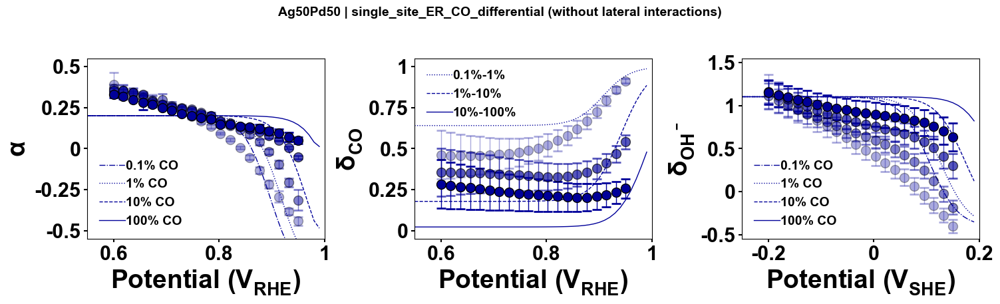

  saved: Ag50Pd50 | single_site_ER_CO_differential


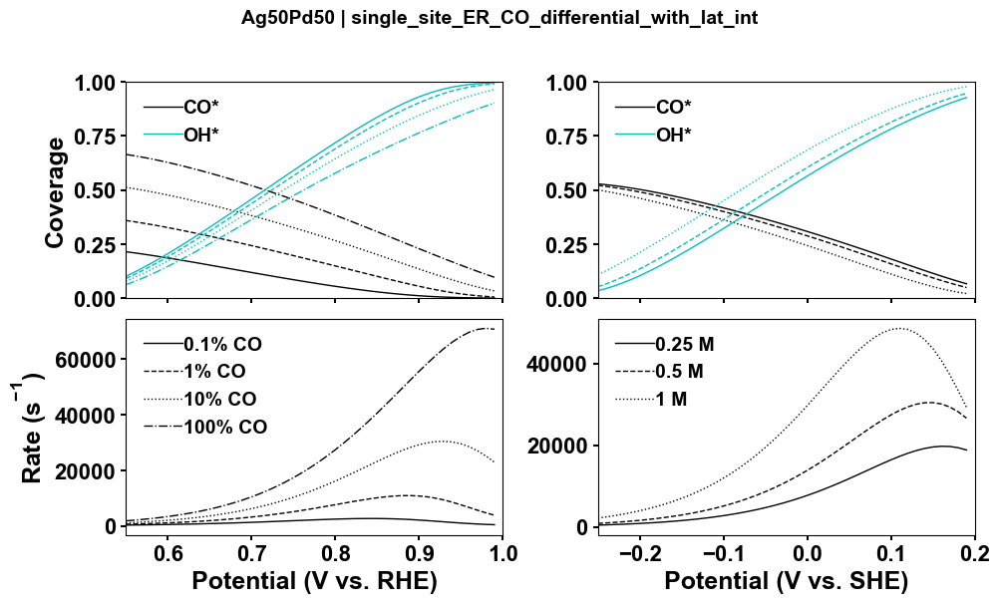

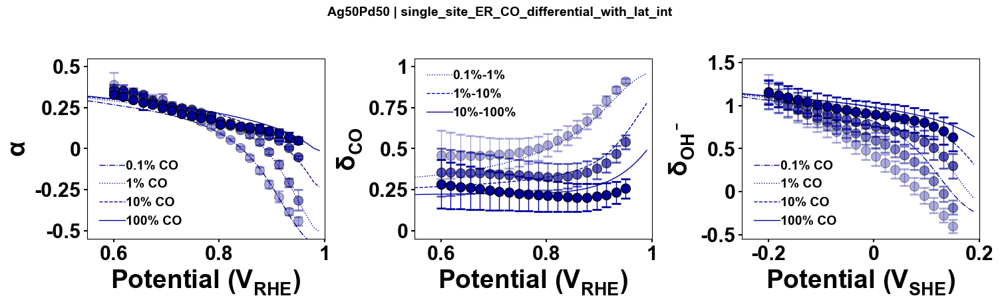

  saved: Ag50Pd50 | single_site_ER_CO_differential_with_lat_int


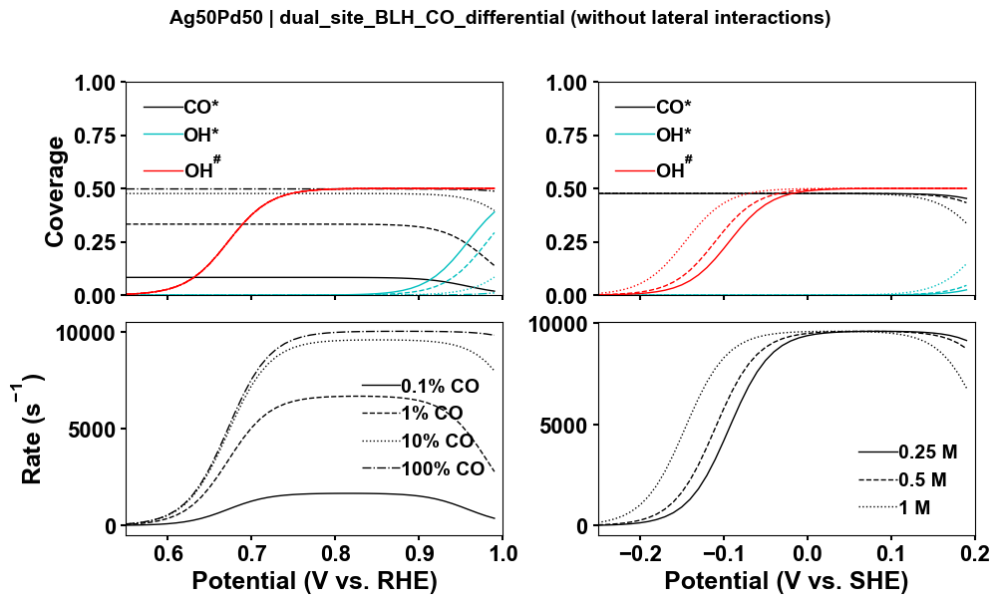

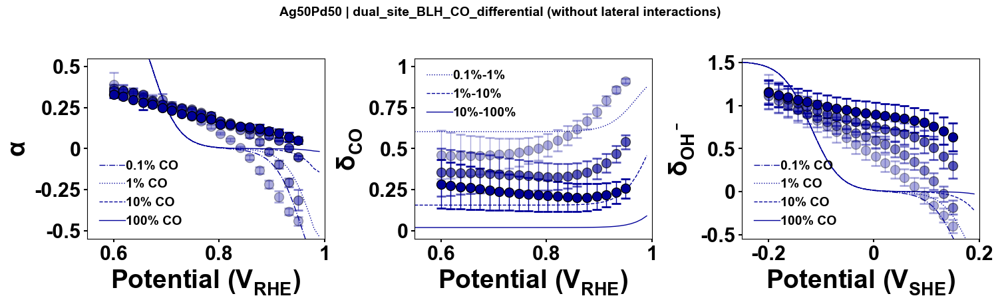

  saved: Ag50Pd50 | dual_site_BLH_CO_differential


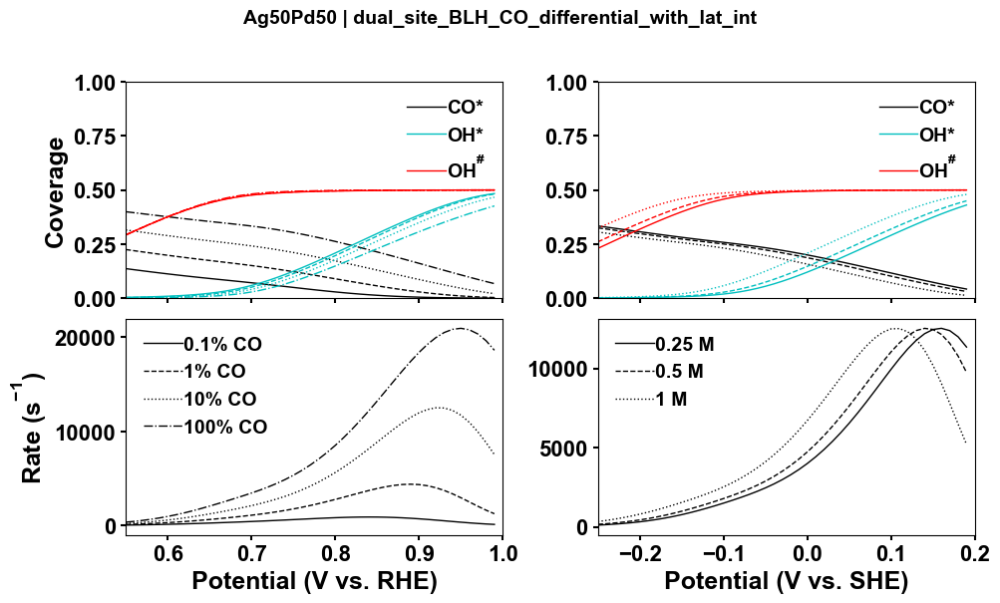

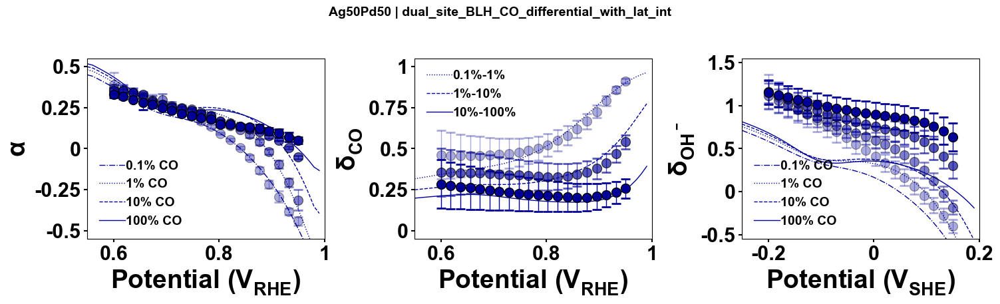

  saved: Ag50Pd50 | dual_site_BLH_CO_differential_with_lat_int


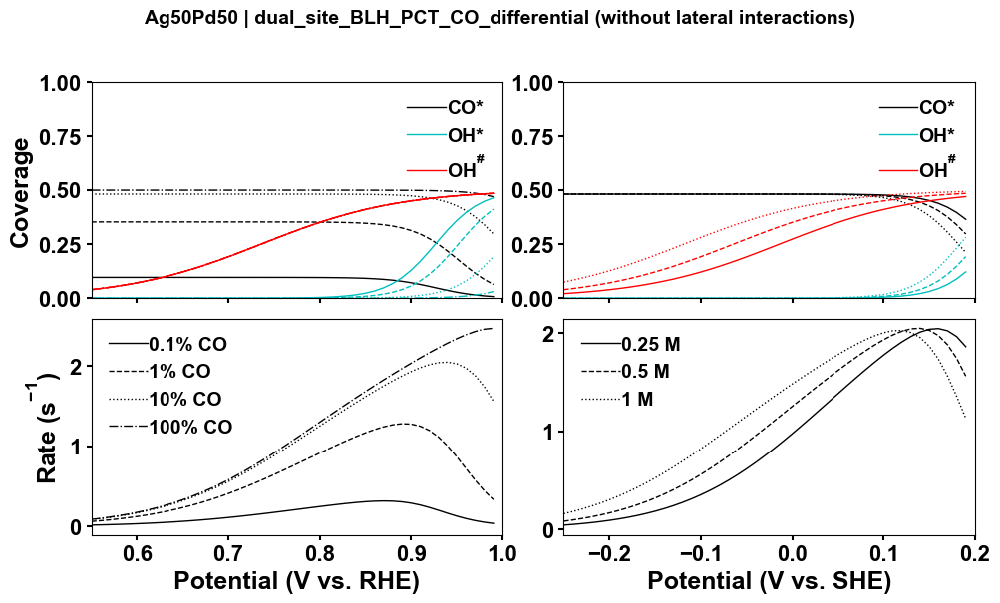

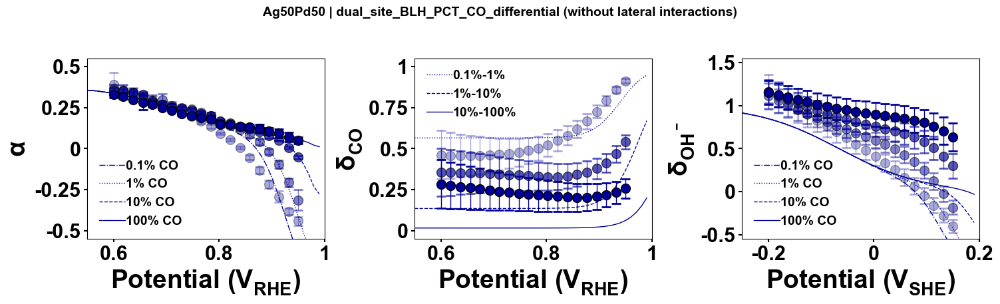

  saved: Ag50Pd50 | dual_site_BLH_PCT_CO_differential


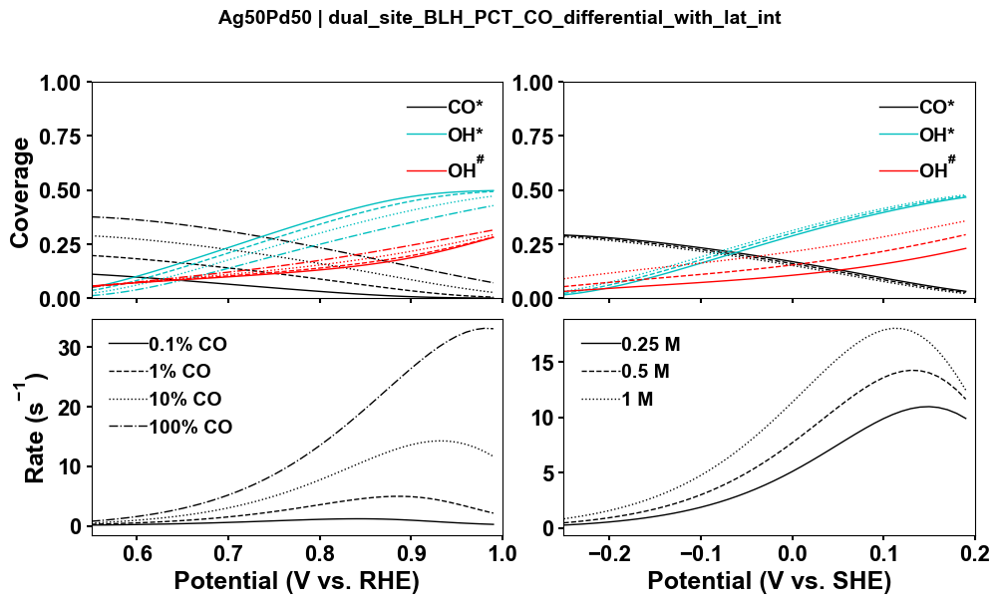

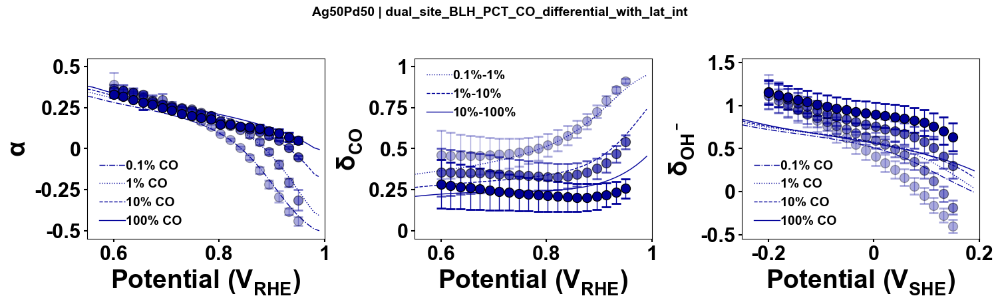

  saved: Ag50Pd50 | dual_site_BLH_PCT_CO_differential_with_lat_int


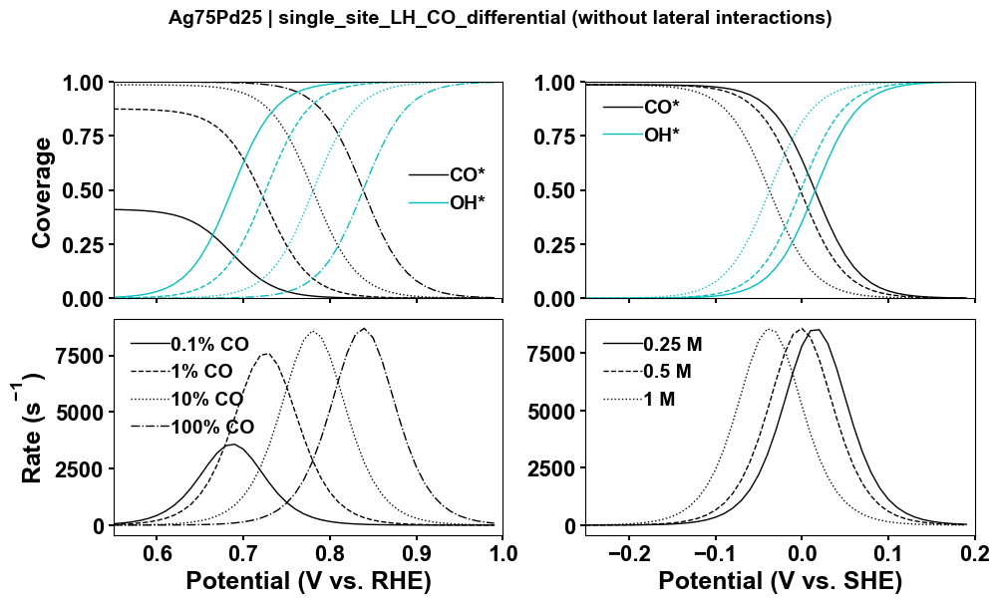

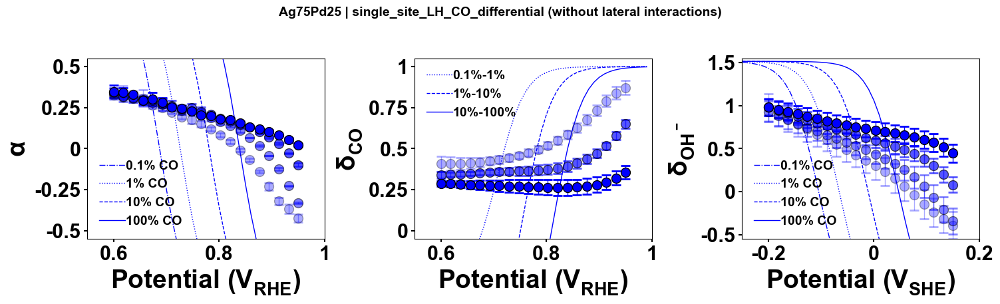

  saved: Ag75Pd25 | single_site_LH_CO_differential


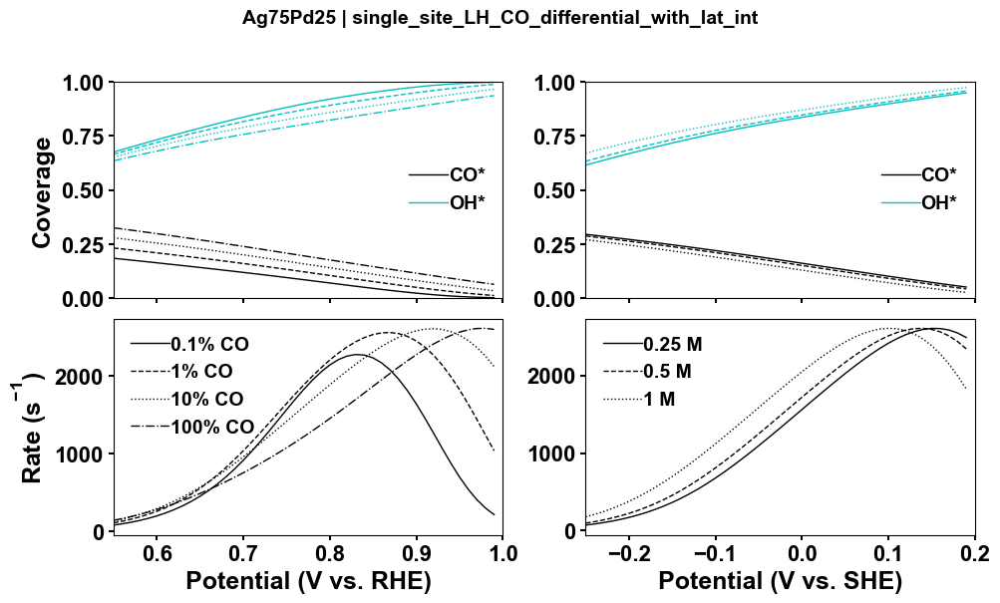

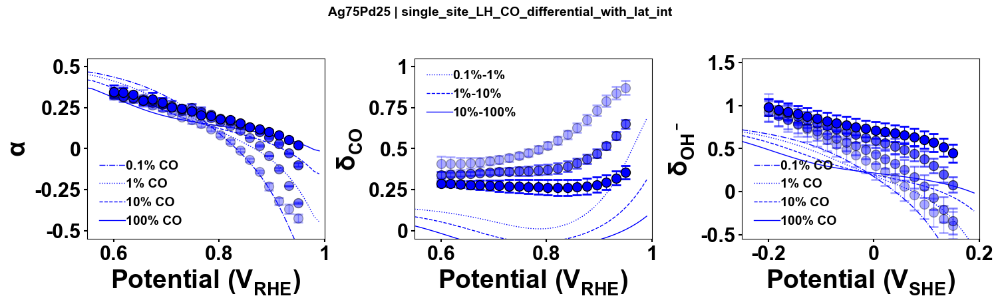

  saved: Ag75Pd25 | single_site_LH_CO_differential_with_lat_int


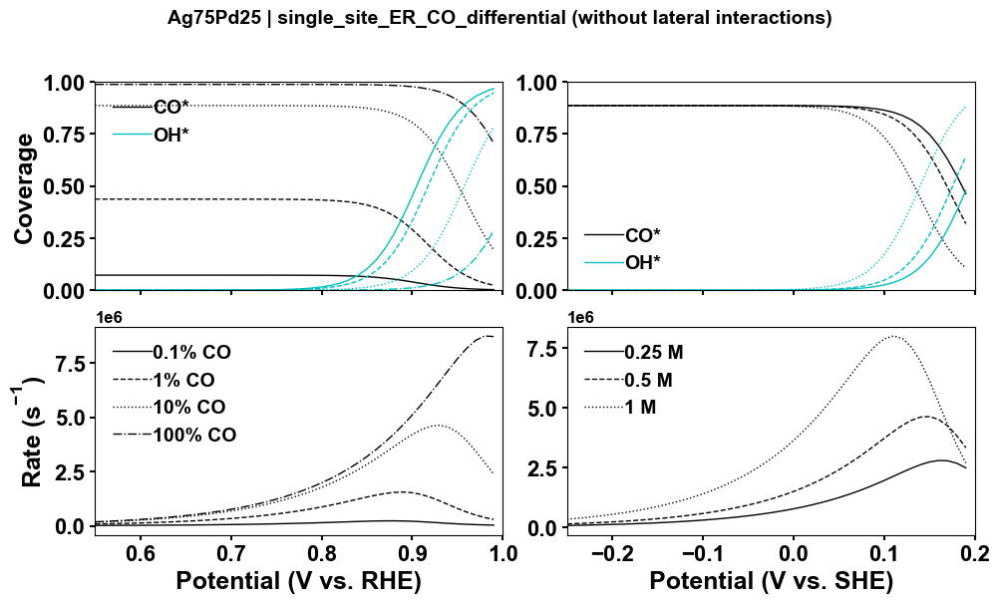

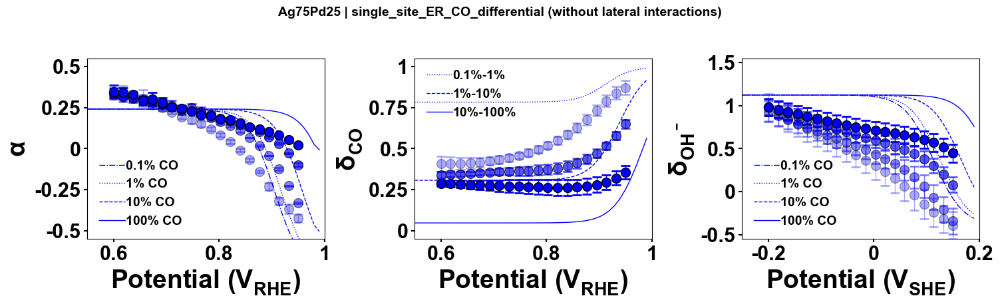

  saved: Ag75Pd25 | single_site_ER_CO_differential


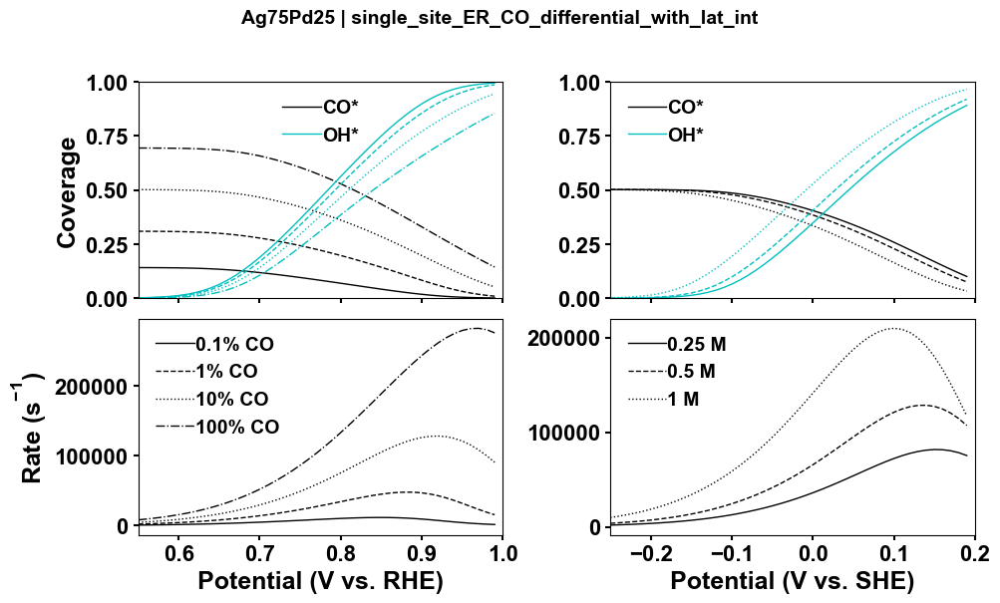

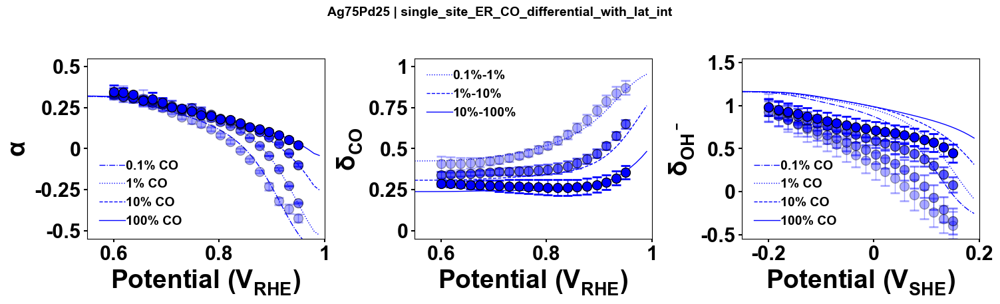

  saved: Ag75Pd25 | single_site_ER_CO_differential_with_lat_int


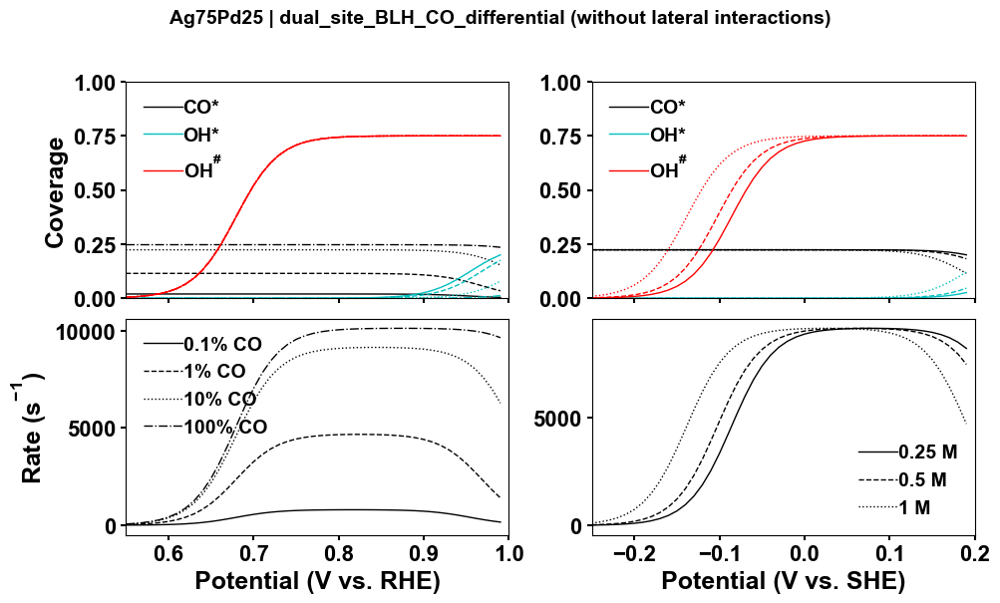

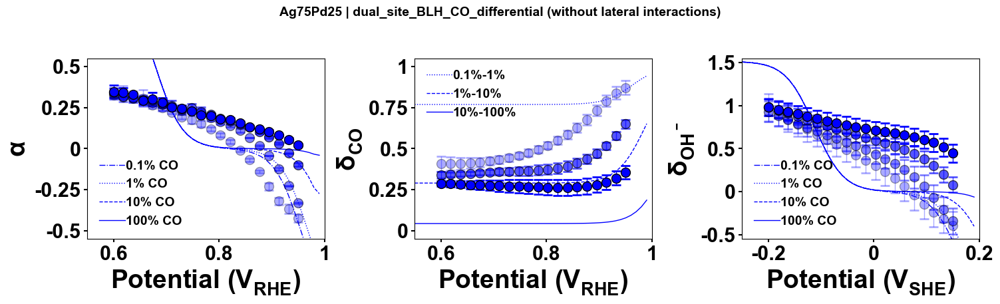

  saved: Ag75Pd25 | dual_site_BLH_CO_differential


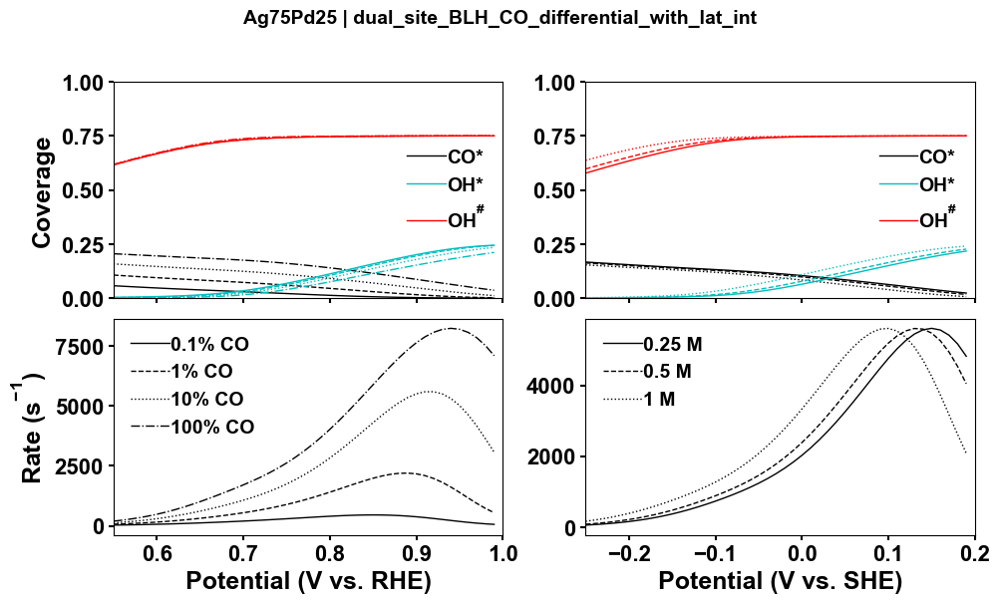

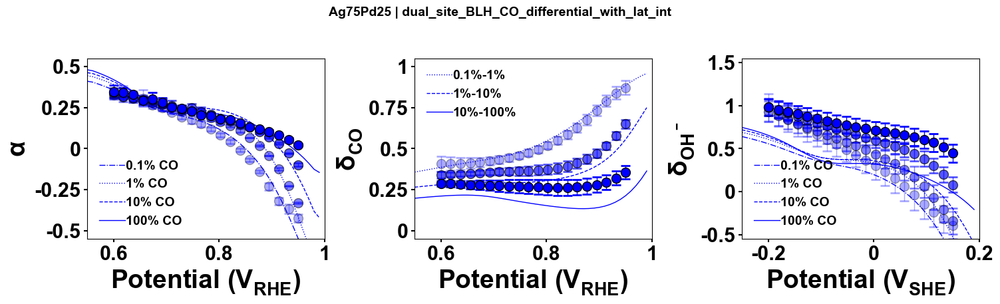

  saved: Ag75Pd25 | dual_site_BLH_CO_differential_with_lat_int


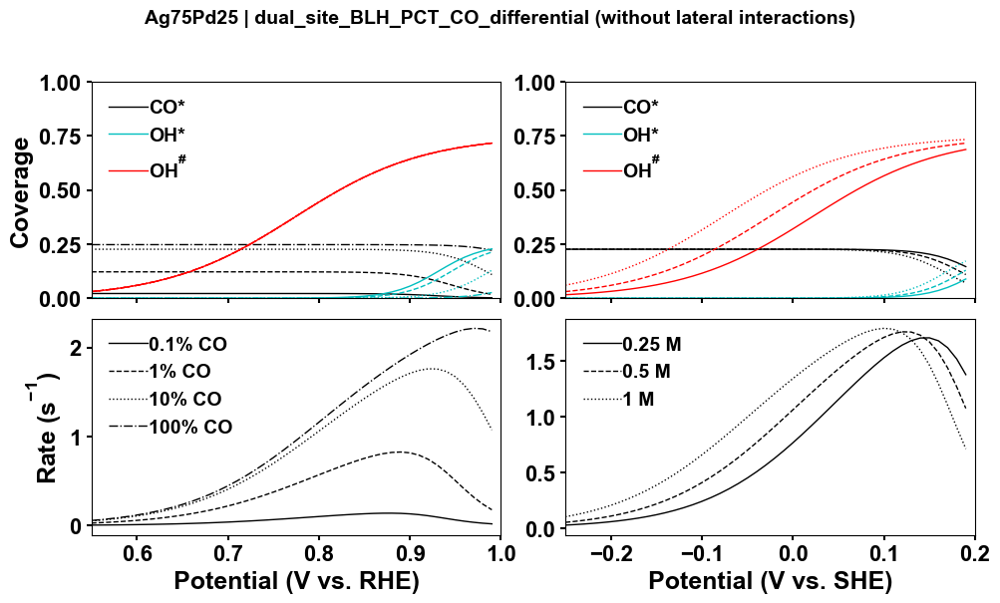

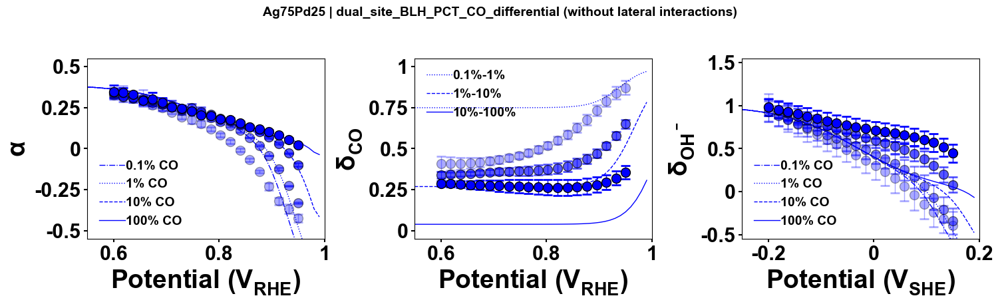

  saved: Ag75Pd25 | dual_site_BLH_PCT_CO_differential


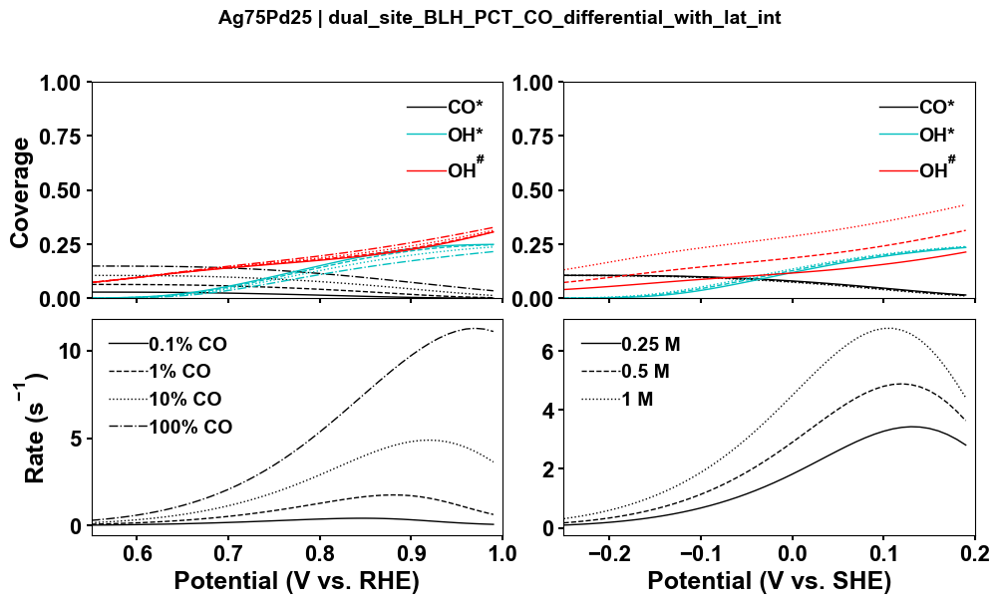

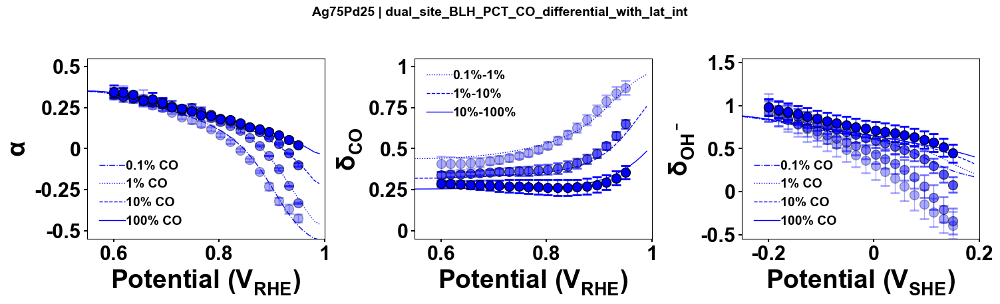

  saved: Ag75Pd25 | dual_site_BLH_PCT_CO_differential_with_lat_int


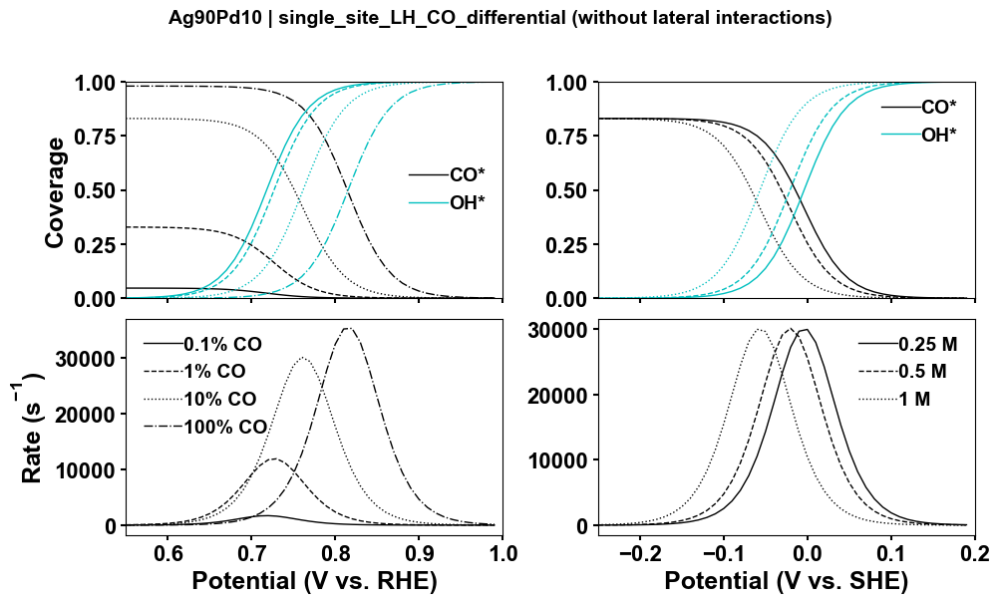

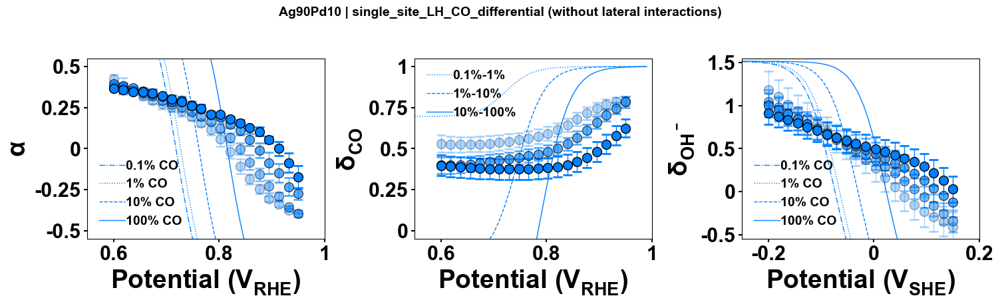

  saved: Ag90Pd10 | single_site_LH_CO_differential


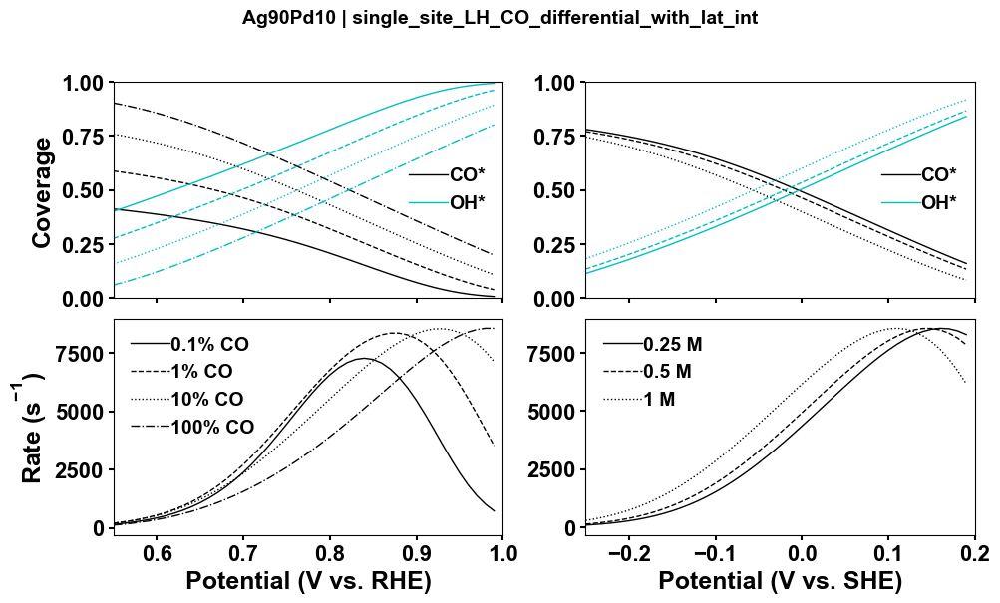

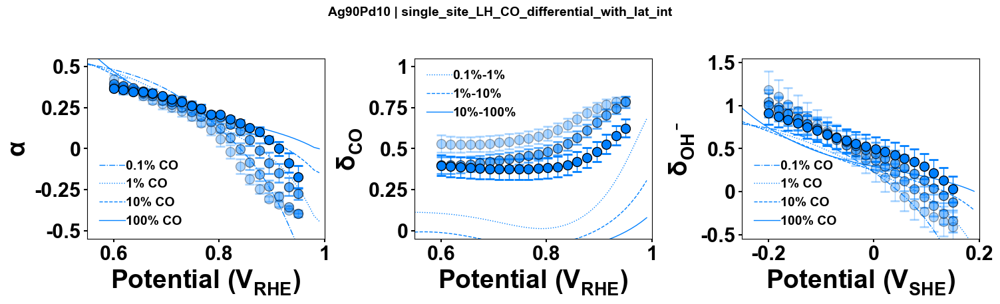

  saved: Ag90Pd10 | single_site_LH_CO_differential_with_lat_int


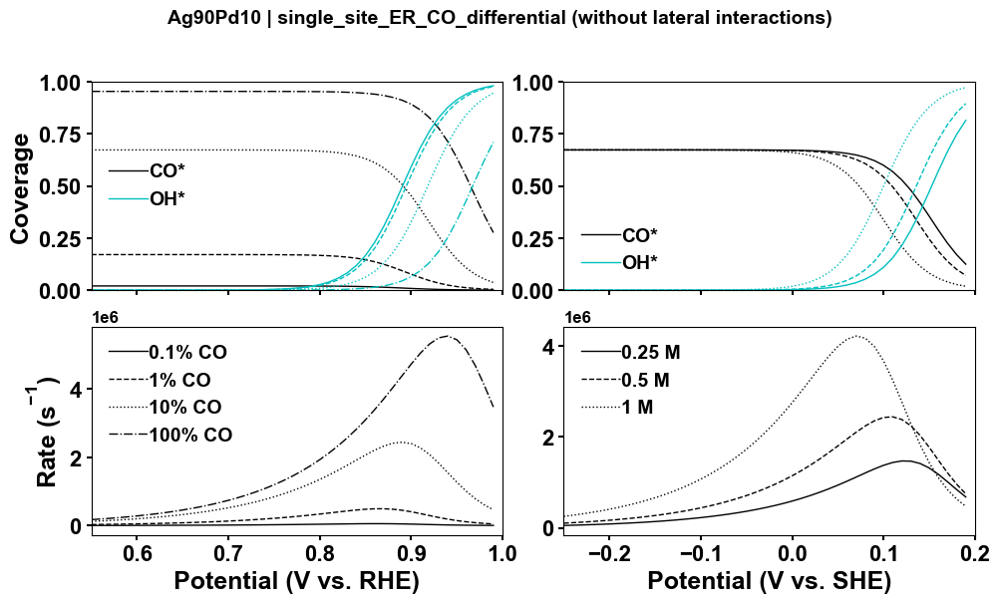

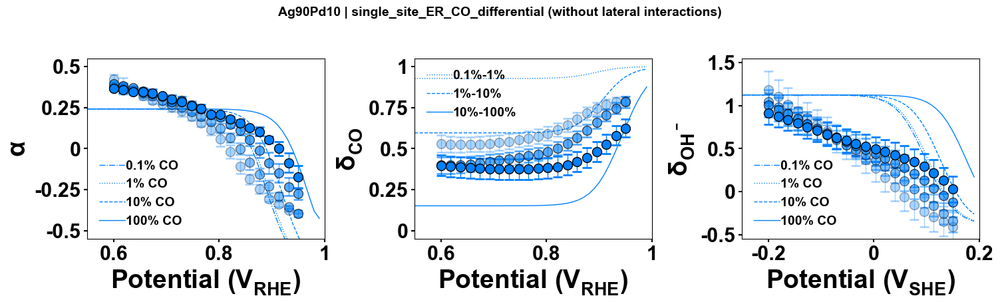

  saved: Ag90Pd10 | single_site_ER_CO_differential


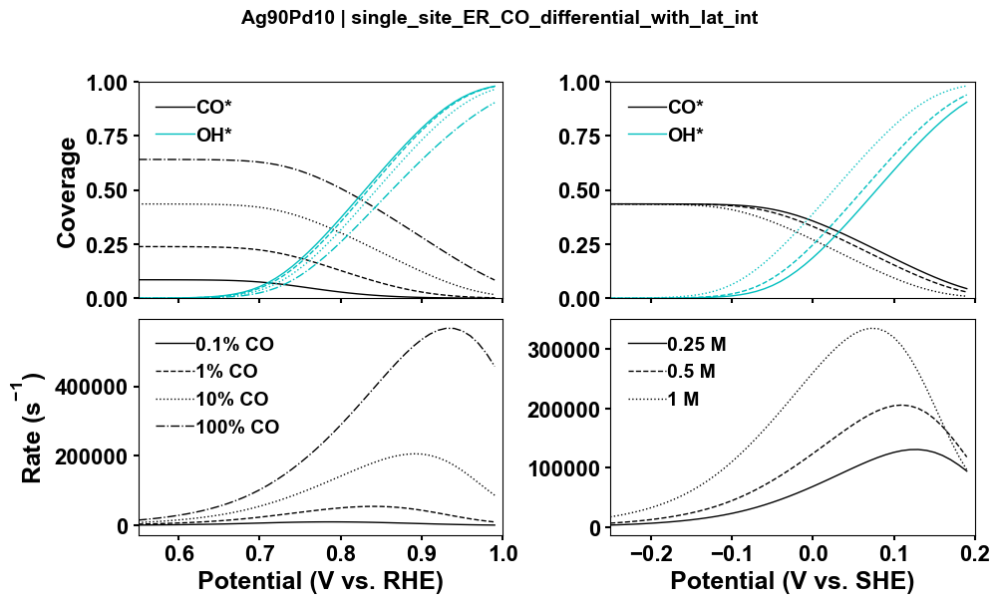

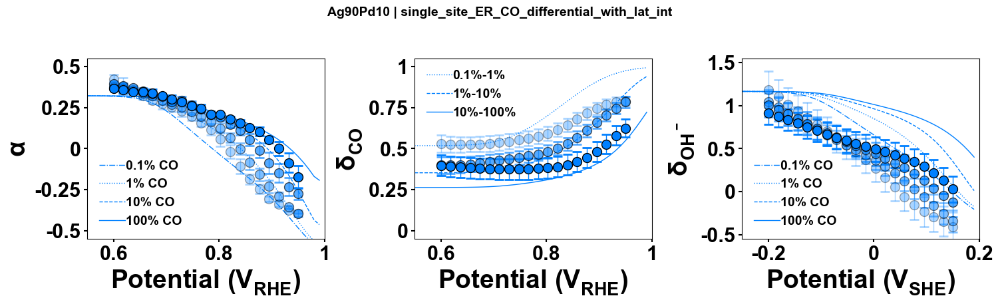

  saved: Ag90Pd10 | single_site_ER_CO_differential_with_lat_int


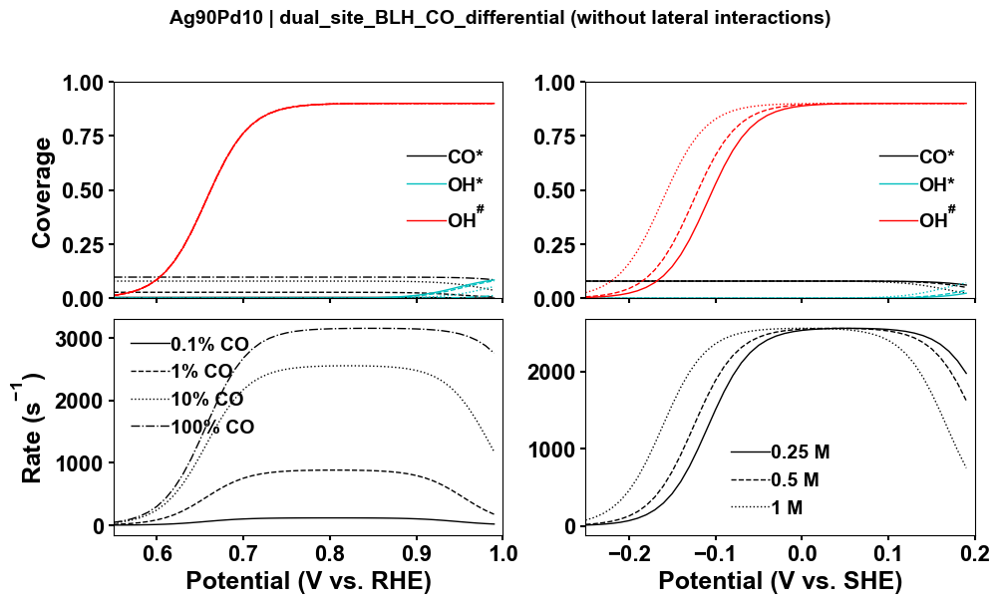

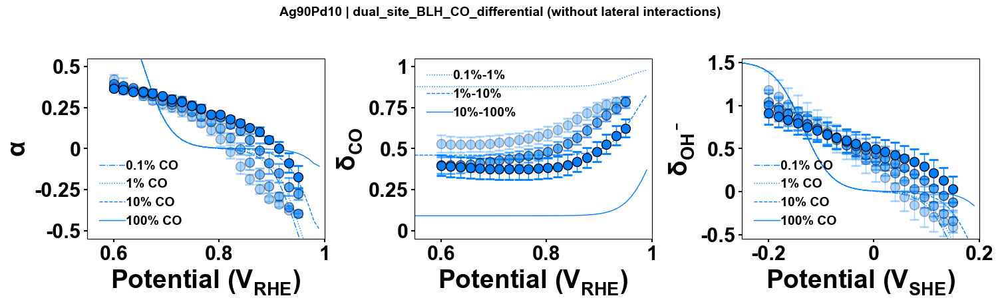

  saved: Ag90Pd10 | dual_site_BLH_CO_differential


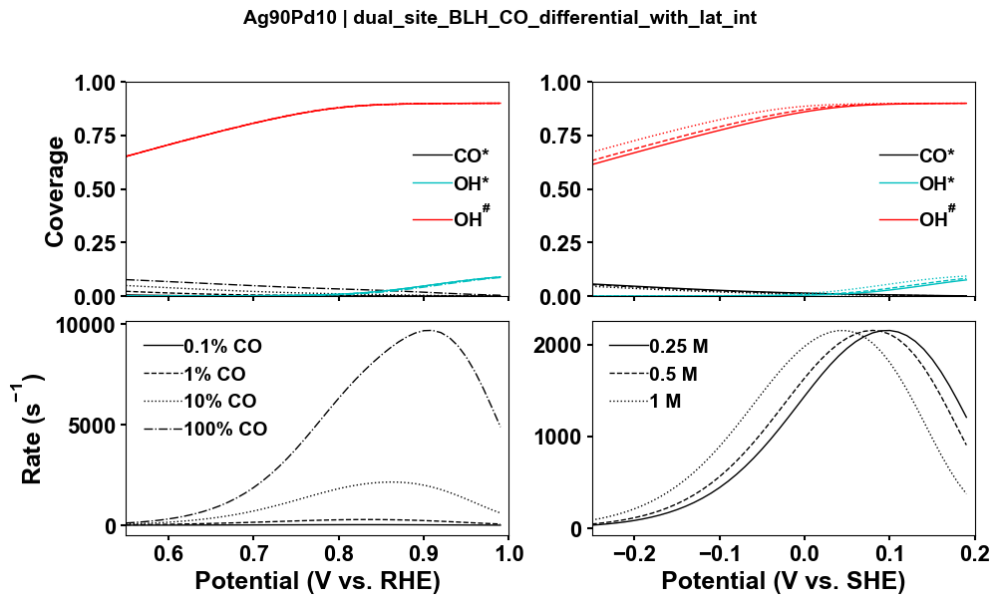

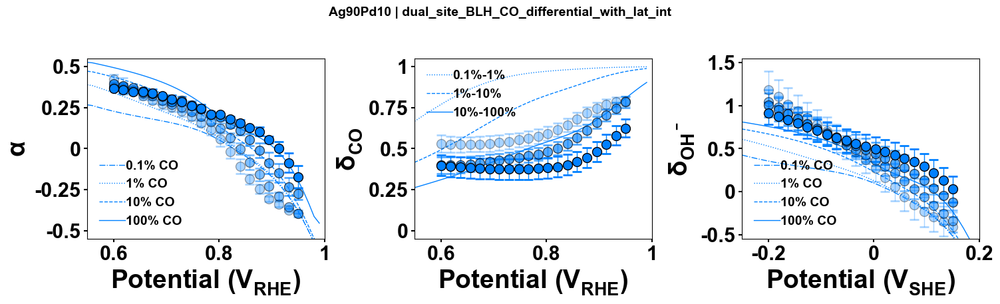

  saved: Ag90Pd10 | dual_site_BLH_CO_differential_with_lat_int


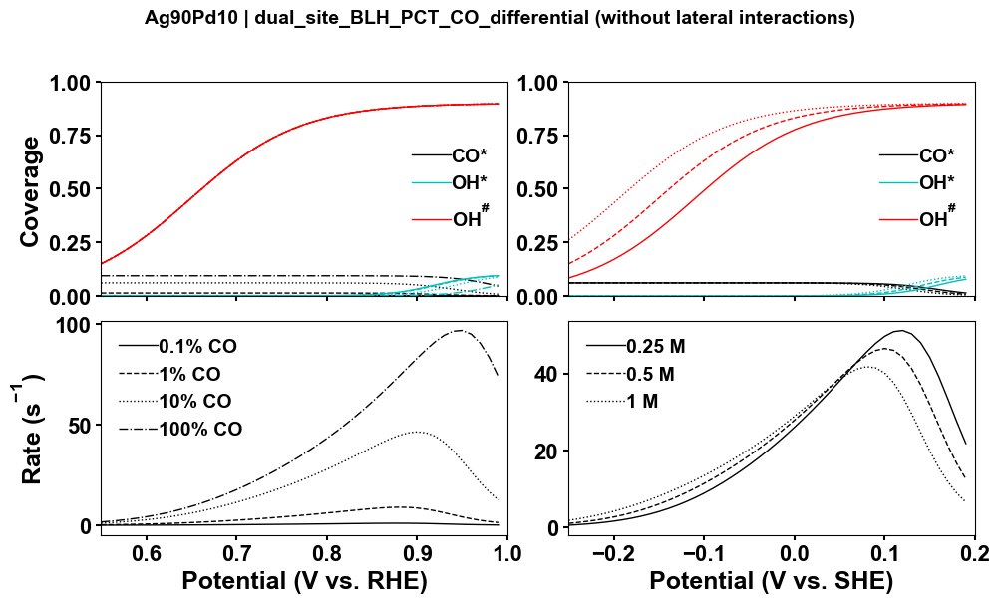

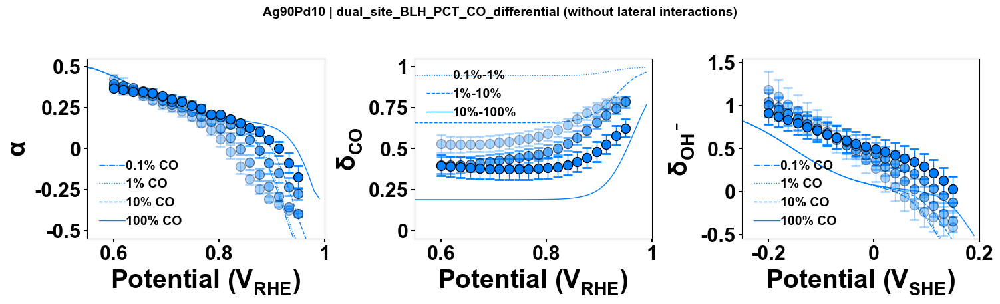

  saved: Ag90Pd10 | dual_site_BLH_PCT_CO_differential


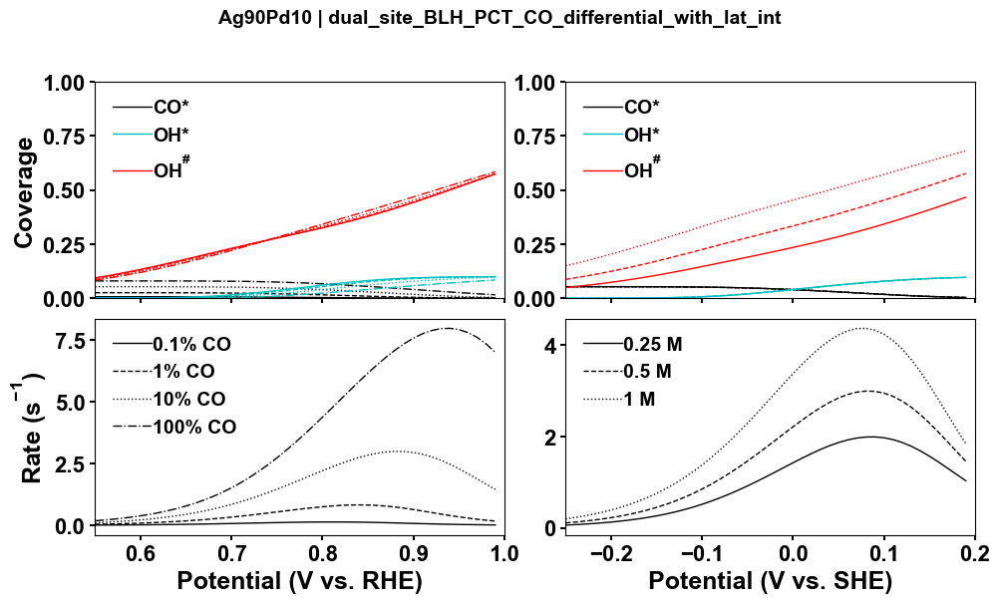

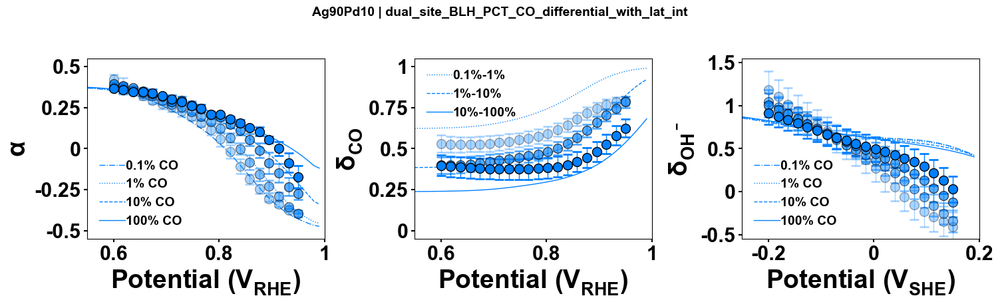

  saved: Ag90Pd10 | dual_site_BLH_PCT_CO_differential_with_lat_int

Done. Saved 92 PNG(s); skipped 2 missing combo(s).
  skipped: Pd100 | dual_site_BLH_PCT_CO_differential
  skipped: Pd100 | dual_site_BLH_PCT_CO_differential_with_lat_int


(['/Users/taylorspivey/Documents/AgPd-CO-electrooxidation-kinetics/Microkinetic Modeling/Pd100_model_outputs/Pd100_single_site_LH_CO_differential_coverages_rates.png',
  '/Users/taylorspivey/Documents/AgPd-CO-electrooxidation-kinetics/Microkinetic Modeling/Pd100_model_outputs/Pd100_single_site_LH_CO_differential_observables.png',
  '/Users/taylorspivey/Documents/AgPd-CO-electrooxidation-kinetics/Microkinetic Modeling/Pd100_model_outputs/Pd100_single_site_LH_CO_differential_with_lat_int_coverages_rates.png',
  '/Users/taylorspivey/Documents/AgPd-CO-electrooxidation-kinetics/Microkinetic Modeling/Pd100_model_outputs/Pd100_single_site_LH_CO_differential_with_lat_int_observables.png',
  '/Users/taylorspivey/Documents/AgPd-CO-electrooxidation-kinetics/Microkinetic Modeling/Pd100_model_outputs/Pd100_single_site_ER_CO_differential_coverages_rates.png',
  '/Users/taylorspivey/Documents/AgPd-CO-electrooxidation-kinetics/Microkinetic Modeling/Pd100_model_outputs/Pd100_single_site_ER_CO_different

In [1]:
# -*- coding: utf-8 -*-
"""
Batch model plotter.

Iterates over every (material, model) combination present on disk and
produces the same two figures that ``individual_model_plotter.py`` makes
for a single selection:

  1. {material}_{model}_coverages_rates.png   (2x2 panel: coverages + rates)
  2. {material}_{model}_observables.png       (1x3 panel: alpha, CO order, OH order)

Each figure carries a ``material | model`` suptitle (annotated with
"(without lateral interactions)" when applicable).  Combinations whose
input xlsx files don't exist (e.g. PCT models for Pd100) are skipped.

PNGs are written into per-catalyst subfolders ``{material}_model_outputs/``
inside this directory; the subfolders are created automatically.
"""

import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd

# Self-locate (cross-platform: every path is built with os.path.join, so
# Windows / macOS / Linux all work without separator assumptions).
# __file__ is defined when run as a script; if this code is pasted into a
# Jupyter cell where __file__ is undefined, fall back to cwd (Jupyter sets
# cwd to the notebook's folder when opened from the file browser).
try:
    SCRIPT_DIR = os.path.dirname(os.path.abspath(__file__))
except NameError:
    SCRIPT_DIR = os.getcwd()


def _model_pot_she(df):
    """Return the model potential vs SHE column if present, else fall back
    to ``Model potential (V vs RHE) - 0.8`` (the legacy ~0.5 M KOH shift used
    in older model-output files that pre-date the SHE column)."""
    col = 'Model potential (V vs SHE)'
    if col in df.columns:
        return df[col]
    return df['Model potential (V vs RHE)'] - 0.8

# --- Publication rcParams (inlined from rcparams_settings.set_rc_params) ----
for _k, _v in {
    'font.sans-serif':         'Arial',
    'font.weight':             'bold',
    'font.size':               12,
    'lines.linewidth':         2,
    'lines.linestyle':         '-',
    'axes.labelsize':          14,
    'axes.labelweight':        'bold',
    'lines.marker':            'o',
    'lines.markeredgecolor':   'black',
    'lines.markeredgewidth':   '2',
    'lines.markersize':        10,
    'mathtext.default':        'regular',
    'errorbar.capsize':        3,
    'legend.frameon':          False,
    'legend.handletextpad':    0.05,
}.items():
    mpl.rcParams[_k] = _v

# --- Material / model registry ---------------------------------------------
MATERIALS = ['Pd100', 'Ag10Pd90', 'Ag25Pd75', 'Ag50Pd50', 'Ag75Pd25', 'Ag90Pd10']

MODELS = [
    'single_site_LH_CO_differential',
    'single_site_LH_CO_differential_with_lat_int',
    'single_site_ER_CO_differential',
    'single_site_ER_CO_differential_with_lat_int',
    'dual_site_BLH_CO_differential',
    'dual_site_BLH_CO_differential_with_lat_int',
    'dual_site_BLH_PCT_CO_differential',
    'dual_site_BLH_PCT_CO_differential_with_lat_int',
]

PLOT_COLORS = {
    'Pd100':    'k',
    'Ag10Pd90': (0.4, 0.0, 0.4),
    'Ag25Pd75': (0.7, 0.0, 0.7),
    'Ag50Pd50': (0.0, 0.0, 0.6),
    'Ag75Pd25': (0.0, 0.0, 1.0),
    'Ag90Pd10': (0.0, 0.5, 1.0),
}


# --- Figure 1: coverages + total rates (2x2) -------------------------------
def plot_coverages_rates(df1, material, model):
    """Return a 2x2 fig: (top) coverages vs RHE (left) / SHE (right);
    (bottom) total rates vs RHE / SHE."""
    fig, axs = plt.subplots(2, 2, figsize=(10, 6))

    is_single = model[0:6] == "single"
    pd_rich   = material in ("Pd100", "Ag10Pd90")
    xlim_rhe  = [0.7, 1.0] if pd_rich else [0.55, 1.0]
    xlim_she  = [-0.1, 0.2] if pd_rich else [-0.25, 0.2]

    # ── (0,0) coverages vs RHE @ 0.5 M KOH ─────────────────────────────────
    a = axs[0, 0]
    a.plot(df1['Model potential (V vs RHE)'], df1['Theta_CO at 0.1% CO, 0.5 M KOH - CO order'], "k-",  linewidth=1, label="CO*")
    a.plot(df1['Model potential (V vs RHE)'], df1['Theta_CO at 1% CO, 0.5 M KOH - CO order'],   "k--", linewidth=1)
    a.plot(df1['Model potential (V vs RHE)'], df1['Theta_CO at 10% CO, 0.5 M KOH - CO order'],  "k:",  linewidth=1)
    a.plot(df1['Model potential (V vs RHE)'], df1['Theta_CO at 100% CO, 0.5 M KOH - CO order'], "k-.", linewidth=1)
    if is_single:
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH at 0.1% CO, 0.5 M KOH - CO order'], "c-",  linewidth=1, label="OH*")
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH at 1% CO, 0.5 M KOH - CO order'],   "c--", linewidth=1)
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH at 10% CO, 0.5 M KOH - CO order'],  "c:",  linewidth=1)
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH at 100% CO, 0.5 M KOH - CO order'], "c-.", linewidth=1)
    else:
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH_S1 at 0.1% CO, 0.5 M KOH - CO order'], "c-",  linewidth=1, label="OH*")
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH_S1 at 1% CO, 0.5 M KOH - CO order'],   "c--", linewidth=1)
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH_S1 at 10% CO, 0.5 M KOH - CO order'],  "c:",  linewidth=1)
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH_S1 at 100% CO, 0.5 M KOH - CO order'], "c-.", linewidth=1)
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH_S2 at 0.1% CO, 0.5 M KOH - CO order'], "r-",  linewidth=1, label=r"OH$^\#$")
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH_S2 at 1% CO, 0.5 M KOH - CO order'],   "r--", linewidth=1)
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH_S2 at 10% CO, 0.5 M KOH - CO order'],  "r:",  linewidth=1)
        a.plot(df1['Model potential (V vs RHE)'], df1['Theta_OH_S2 at 100% CO, 0.5 M KOH - CO order'], "r-.", linewidth=1)
    a.set_ylabel("Coverage", fontsize=18)
    a.tick_params(axis="x", labelbottom=False, width=1.5)
    a.tick_params(axis="y", labelsize=16, width=1.5)
    a.set_xlim(xlim_rhe)
    a.set_ylim([0, 1])
    a.legend(fontsize=14)

    # ── (0,1) coverages vs SHE @ 10% CO ────────────────────────────────────
    a = axs[0, 1]
    a.plot(_model_pot_she(df1), df1['Theta_CO at 10% CO, 0.25 M KOH - OH order'], "k-",  linewidth=1, label="CO*")
    a.plot(_model_pot_she(df1), df1['Theta_CO at 10% CO, 0.5 M KOH - OH order'],  "k--", linewidth=1)
    a.plot(_model_pot_she(df1), df1['Theta_CO at 10% CO, 1 M KOH - OH order'],    "k:",  linewidth=1)
    if is_single:
        a.plot(_model_pot_she(df1), df1['Theta_OH at 10% CO, 0.25 M KOH - OH order'], "c-",  linewidth=1, label="OH*")
        a.plot(_model_pot_she(df1), df1['Theta_OH at 10% CO, 0.5 M KOH - OH order'],  "c--", linewidth=1)
        a.plot(_model_pot_she(df1), df1['Theta_OH at 10% CO, 1 M KOH - OH order'],    "c:",  linewidth=1)
    else:
        a.plot(_model_pot_she(df1), df1['Theta_OH_S1 at 10% CO, 0.25 M KOH - OH order'], "c-",  linewidth=1, label="OH*")
        a.plot(_model_pot_she(df1), df1['Theta_OH_S1 at 10% CO, 0.5 M KOH - OH order'],  "c--", linewidth=1)
        a.plot(_model_pot_she(df1), df1['Theta_OH_S1 at 10% CO, 1 M KOH - OH order'],    "c:",  linewidth=1)
        a.plot(_model_pot_she(df1), df1['Theta_OH_S2 at 10% CO, 0.25 M KOH - OH order'], "r-",  linewidth=1, label=r"OH$^\#$")
        a.plot(_model_pot_she(df1), df1['Theta_OH_S2 at 10% CO, 0.5 M KOH - OH order'],  "r--", linewidth=1)
        a.plot(_model_pot_she(df1), df1['Theta_OH_S2 at 10% CO, 1 M KOH - OH order'],    "r:",  linewidth=1)
    a.tick_params(axis="x", labelbottom=False, width=1.5)
    a.tick_params(axis="y", labelsize=16, width=1.5)
    a.set_xlim(xlim_she)
    a.set_ylim([0, 1])
    a.legend(fontsize=14)

    # ── (1,0) total rate vs RHE @ 0.5 M KOH ────────────────────────────────
    a = axs[1, 0]
    a.plot(df1['Model potential (V vs RHE)'], df1['Total Rate at 0.1% CO, 0.5 M KOH - CO order'], "k-",  linewidth=1, label="0.1% CO")
    a.plot(df1['Model potential (V vs RHE)'], df1['Total Rate at 1% CO, 0.5 M KOH - CO order'],   "k--", linewidth=1, label="1% CO")
    a.plot(df1['Model potential (V vs RHE)'], df1['Total Rate at 10% CO, 0.5 M KOH - CO order'],  "k:",  linewidth=1, label="10% CO")
    a.plot(df1['Model potential (V vs RHE)'], df1['Total Rate at 100% CO, 0.5 M KOH - CO order'], "k-.", linewidth=1, label="100% CO")
    a.set_xlabel("Potential (V vs. RHE)", fontsize=18)
    a.set_ylabel("Rate (s$^{-1}$)", fontsize=18)
    a.tick_params(axis="x", width=1.5, labelsize=16)
    a.tick_params(axis="y", labelsize=16, width=1.5)
    a.set_xlim(xlim_rhe)
    a.legend(fontsize=14)

    # ── (1,1) total rate vs SHE @ 10% CO ───────────────────────────────────
    a = axs[1, 1]
    a.plot(_model_pot_she(df1), df1['Total Rate at 10% CO, 0.25 M KOH - OH order'], "k-",  linewidth=1, label="0.25 M")
    a.plot(_model_pot_she(df1), df1['Total Rate at 10% CO, 0.5 M KOH - OH order'],  "k--", linewidth=1, label="0.5 M")
    a.plot(_model_pot_she(df1), df1['Total Rate at 10% CO, 1 M KOH - OH order'],    "k:",  linewidth=1, label="1 M")
    a.set_xlabel("Potential (V vs. SHE)", fontsize=18)
    a.tick_params(axis="x", width=1.5, labelsize=16)
    a.tick_params(axis="y", labelsize=16, width=1.5)
    a.set_xlim(xlim_she)
    a.legend(fontsize=14)

    return fig


# --- Figure 2: alpha, CO-order, OH-order (1x3) -----------------------------
def plot_observables(df2, material, model, plot_color):
    """Return a 1x3 fig: alpha vs RHE | delta_CO vs RHE | delta_OH vs SHE."""
    fig, axs = plt.subplots(1, 3, figsize=(15, 4.5))
    pd_rich = material in ("Pd100", "Ag10Pd90")

    # === alpha ===
    a = axs[0]
    for co, ls, alpha_ in [('0.1%', '-.', 0.333),
                           ('1%',   ':',  0.5),
                           ('10%',  '--', 0.666),
                           ('100%', '-',  1.0)]:
        a.plot(df2['Model potential (V vs RHE)'],
               df2[f'Model transfer coefficient at {co} CO, 0.5 M KOH'],
               color=plot_color, linestyle=ls, linewidth=1, label=f'{co} CO', marker='none')
        ymean = df2[f'Experimental transfer coefficient at {co} CO, 0.5 M KOH']
        yerr  = df2[f'Experimental transfer coefficient error at {co} CO, 0.5 M KOH']
        a.errorbar(df2['Experimental potential (V vs RHE)'], ymean, yerr=yerr,
                   color=plot_color, fmt="o", alpha=alpha_, markersize=10,
                   markeredgewidth=1, elinewidth=1, ecolor=plot_color,
                   capsize=0, capthick=0, markeredgecolor="k")
        a.scatter(df2['Experimental potential (V vs RHE)'], ymean + yerr,
                  marker='_', color=plot_color, alpha=alpha_)
        a.scatter(df2['Experimental potential (V vs RHE)'], ymean - yerr,
                  marker='_', color=plot_color, alpha=alpha_)
    a.set_xlabel("Potential ($V_{RHE}$)", fontsize=28)
    a.set_ylabel(r"$\alpha$", fontsize=28)
    a.tick_params(axis="x", width=1.5, labelsize=22)
    a.tick_params(axis="y", labelsize=22, width=1.5)
    if pd_rich:
        a.set_xticks([0.75, 0.85, 0.95], ['0.75', '0.85', '0.95'])
        a.set_xlim([0.7, 1.0])
    else:
        a.set_xticks([0.6, 0.8, 1.0], ['0.6', '0.8', '1'])
        a.set_xlim([0.55, 1.0])
    a.set_yticks([-0.5, -0.25, 0, 0.25, 0.5], ['-0.5', '-0.25', '0', '0.25', '0.5'])
    a.set_ylim([-0.55, 0.55])
    a.legend(ncol=1, loc="lower left", columnspacing=0.25, fontsize=14)

    # === delta_CO ===
    a = axs[1]
    for span, ls, alpha_ in [('0.1% - 1%',  ':',  0.333),
                             ('1% - 10%',   '--', 0.666),
                             ('10% - 100%', '-',  1.0)]:
        a.plot(df2['Model potential (V vs RHE)'],
               df2[f'Model CO order at 0.5 M KOH, {span} CO'],
               color=plot_color, linestyle=ls, linewidth=1,
               label=span.replace(' ', '').replace('CO', ''), marker='none')
        ymean = df2[f'Experimental CO order at 0.5 M KOH, {span} CO']
        yerr  = df2[f'Experimental CO order error at 0.5 M KOH, {span} CO']
        a.errorbar(df2['Experimental potential (V vs RHE)'], ymean, yerr=yerr,
                   color=plot_color, fmt="o", alpha=alpha_, markersize=10,
                   markeredgewidth=1, elinewidth=1, ecolor=plot_color,
                   capsize=0, capthick=0, markeredgecolor="k")
        a.scatter(df2['Experimental potential (V vs RHE)'], ymean + yerr,
                  marker='_', color=plot_color, alpha=alpha_)
        a.scatter(df2['Experimental potential (V vs RHE)'], ymean - yerr,
                  marker='_', color=plot_color, alpha=alpha_)
    a.set_xlabel("Potential ($V_{RHE}$)", fontsize=28)
    a.set_ylabel(r"$\delta_{CO}$", fontsize=28)
    a.tick_params(axis="x", labelsize=22, width=1.5)
    a.tick_params(axis="y", labelsize=22, width=1.5)
    if pd_rich:
        a.set_xticks([0.75, 0.85, 0.95], ['0.75', '0.85', '0.95'])
        a.set_xlim([0.7, 1.0])
    else:
        a.set_xticks([0.6, 0.8, 1.0], ['0.6', '0.8', '1'])
        a.set_xlim([0.55, 1.0])
    a.set_yticks([0, 0.25, 0.5, 0.75, 1], ['0', '0.25', '0.5', '0.75', '1'])
    a.set_ylim([-0.05, 1.05])
    a.legend(ncol=1, loc="upper left", columnspacing=0.25, fontsize=14)

    # === delta_OH ===
    a = axs[2]
    for co, ls, alpha_ in [('0.1%', '-.', 0.333),
                           ('1%',   ':',  0.5),
                           ('10%',  '--', 0.666),
                           ('100%', '-',  1.0)]:
        a.plot(_model_pot_she(df2),
               df2[f'Model OH order at {co} CO'],
               color=plot_color, linestyle=ls, linewidth=1, label=f'{co} CO', marker='none')
        ymean = df2[f'Experimental OH order at {co} CO']
        yerr  = df2[f'Experimental OH order error at {co} CO']
        a.errorbar(df2['Experimental potential (V vs SHE)'], ymean, yerr=yerr,
                   color=plot_color, fmt="o", alpha=alpha_, markersize=10,
                   markeredgewidth=1, elinewidth=1, ecolor=plot_color,
                   capsize=0, capthick=0, markeredgecolor="k")
        a.scatter(df2['Experimental potential (V vs SHE)'], ymean + yerr,
                  marker='_', color=plot_color, alpha=alpha_)
        a.scatter(df2['Experimental potential (V vs SHE)'], ymean - yerr,
                  marker='_', color=plot_color, alpha=alpha_)
    a.set_xlabel("Potential ($V_{SHE}$)", fontsize=28)
    a.set_ylabel(r"$\delta_{OH^-}$", fontsize=28)
    a.tick_params(axis="x", labelsize=22, width=1.5)
    a.tick_params(axis="y", labelsize=22, width=1.5)
    if pd_rich:
        a.set_xticks([-0.05, 0.05, 0.15], ['-0.05', '0.05', '0.15'])
        a.set_xlim([-0.1, 0.2])
    else:
        a.set_xticks([-0.2, 0, 0.2], ['-0.2', '0', '0.2'])
        a.set_xlim([-0.25, 0.2])
    a.set_yticks([-0.5, 0, 0.5, 1, 1.5], ['-0.5', '0', '0.5', '1', '1.5'])
    a.set_ylim([-0.55, 1.55])
    a.legend(ncol=1, loc="lower left", columnspacing=0.25, fontsize=14)

    return fig


# --- Batch loop ------------------------------------------------------------
def run_batch(materials=MATERIALS, models=MODELS, save_dir=None,
              data_root=None):
    """save_dir / data_root default to this script's own folder
    (SCRIPT_DIR) so the loop works regardless of cwd."""
    if save_dir is None:
        save_dir = SCRIPT_DIR
    if data_root is None:
        data_root = SCRIPT_DIR
    saved = []
    skipped = []
    for material in materials:
        plot_color = PLOT_COLORS[material]
        for model in models:
            cov_path = os.path.join(data_root, material, f'{material}_{model}_coverages_rates.xlsx')
            obs_path = os.path.join(data_root, material, f'{material}_{model}_observables.xlsx')
            if not (os.path.exists(cov_path) and os.path.exists(obs_path)):
                skipped.append((material, model))
                continue

            df1 = pd.read_excel(cov_path)
            df2 = pd.read_excel(obs_path)

            li_tag = '' if '_with_lat_int' in model else ' (without lateral interactions)'
            suptitle = f'{material} | {model}{li_tag}'

            # Per-catalyst output folder, created on first use.
            cat_out_dir = os.path.join(save_dir, f'{material}_model_outputs')
            os.makedirs(cat_out_dir, exist_ok=True)

            # Figure 1 — leave 6% top margin via tight_layout(rect=...) so the
            # suptitle does not collide with panel content.
            fig1 = plot_coverages_rates(df1, material, model)
            fig1.suptitle(suptitle, fontsize=14, fontweight='bold', y=0.99)
            fig1.tight_layout(pad=0.5, rect=[0, 0, 1, 0.94])
            out1 = os.path.join(cat_out_dir, f'{material}_{model}_coverages_rates.png')
            fig1.savefig(out1, dpi=1200, bbox_inches='tight', pad_inches=0.05)
            plt.show()
            plt.close(fig1)
            saved.append(out1)

            # Figure 2 — 1x3 layout is short; use a slightly larger top reserve
            # so the suptitle clears axis titles + x-axis tick labels above.
            fig2 = plot_observables(df2, material, model, plot_color)
            fig2.suptitle(suptitle, fontsize=14, fontweight='bold', y=0.99)
            fig2.tight_layout(pad=0.5, rect=[0, 0, 1, 0.90])
            out2 = os.path.join(cat_out_dir, f'{material}_{model}_observables.png')
            fig2.savefig(out2, dpi=1200, bbox_inches='tight', pad_inches=0.05)
            plt.show()
            plt.close(fig2)
            saved.append(out2)

            print(f'  saved: {material} | {model}')
    print(f'\nDone. Saved {len(saved)} PNG(s); skipped {len(skipped)} missing combo(s).')
    if skipped:
        for m, mod in skipped:
            print(f'  skipped: {m} | {mod}')
    return saved, skipped


run_batch()
